## Embedding 100,000 model galaxy spectra with diverse star formation histories

Authored by OGT 17-11-01

### Contents of this notebook
These are my attempts at generating embeddings of model (noise-free) galaxy spectra. I do this for 10,000 and 100,000 spectra (the former is faster, so allows me to iterate more quickly; the latter checks whether results change when the manifold is better populated). I show the log(neighbors) vs. log(radius) relation, which indicates that the dimension of the data is about 3. I show the results of calculating embeddings in 8 dimensions for varying radius and try to look for correlations between the parameters varied in generating the model spectra and the dimensions in the embeddings. I found an interesting subset of data in one of the embeddings (models with young stellar ages), and explore this subset at the end. These have a higher dimension (3.5 vs. 3.0) than the full dataset.

Note: I have also tried embedding in 6 and 10 dimensions, but as far as I can tell, the first 6 dimensions don't change much and no information is gained by going from 8 to 10 dimensions in the embedding.

### How the model spectra were generated
I used the modeling software [FSPS](https://github.com/cconroy20/fsps) (and a Python wrapper, [python-fsps](https://github.com/dfm/python-fsps)) to generate these spectra. I varied six parameters, the first four of which control the form of the star formation history (SFH):
  * $\tau$ (Gyr): exponential decay timescale, controls how quickly SF declines for $\mathrm{SFR}\propto t e^{-t/\tau}$; higher $\tau$ means more ongoing SF at present day
  * $t_{start}$ (Gyr): time after the Big Bang when star formation began
  * $f_{burst}$: fraction of stars formed in an instantaneous burst
  * $t_{burst}$ (Gyr): time after the Big Bang when the burst of star formation occurred
  * dust: the opacity of dust in a galaxy. Dust preferentially absorbs light at smaller wavelengths, changing the overall spectral shape
  * $Z$, metallicity: the metal content of stars in the galaxy. Changes both absorption line strengths and overall spectral shape. Defined on a log scale relative to Solar metallicity: $Z=0$ means Solar metallicity, $Z=-1$ means 10x smaller metal content than the Sun.
  
I assume that all spectra are being observed at the present day, 13.7 Gyr after the Big Bang. From the four SFH-related paramters, I calculate the mean stellar age, which I use as a convenience parameter to capture all four SFH-related parameters in color-codings (this will usually be fair, not always):

$A = 13.7 - t_{start}$

$ \left< \mathrm{Age}_\tau \right> = \frac{(A - \tau)( (1 - (\frac{A}{\tau} + 1) e^{-A/\tau}) }{ (1 - e^{-A/\tau}) )}$ -- definition of mean age given the delayed-tau model adopted for the SFH

$\left< \mathrm{Age} \right> = (1-f_{burst}) \left< \mathrm{Age}_\tau \right> + f_{burst} (13.7 - t_{burst})$

-- weighted mean of the age due to the delayed-tau component and the age of the burst component, weighted by the burst fraction

All spectra are normalized by the area under the curve. This effectively normalizes out the total stellar mass formed, so we are only using information about the overall spectral shape and the absorption line strengths.

### Table of Contents
Use the following links to jump to a particular set of plots:

[About the parameters in these models and their distributions](#aboutModels)

[Neighbors vs. Radius and choice of cutoff radius](#chooseRadius)

[Compute embedding for my best estimate cutoff radius for 10,000 spectra](#optimalRadiusEmbed)

[Compute embedding for a large cutoff radius for 10,000 spectra](#bigRadius)

[Compute embedding for a large cutoff radius for 100,000 spectra](#embedBigRadiusBigSample)

[Compute embedding for my best estimate cutoff radius for 100,000 spectra](#embedOptimalRadiusBigSample)

[Neighbors vs. Radius and choice of cutoff radius for young mean stellar age models](#youngModels)

[Compute embedding for a large cutoff radius for young mean stellar age models](#radiusBigYoungModels)

In [1]:
# imports and plotting setup
import numpy as np
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)
import matplotlib.pyplot as plt
%matplotlib inline
from astroML.plotting import setup_text_plots
import h5py
import fsps
import math

from megaman.geometry import Geometry
from megaman.embedding import SpectralEmbedding
from scipy.io import mmwrite
from scipy.sparse.csgraph import connected_components
from sklearn.metrics.pairwise import euclidean_distances

np.set_printoptions(suppress=True)
mpl.rc('xtick', labelsize=16)
mpl.rc('ytick', labelsize=16)
mpl.rc('xtick.major', width=2)
mpl.rc('ytick.major', width=2)
mpl.rc('axes', labelsize=18, linewidth=2, titlesize=18)
mpl.rc('figure', titlesize=18)
mpl.rc('lines', linewidth=3)
mpl.rc('legend', fontsize=16)

In [2]:
# load data

f = h5py.File('../data/1e5_spectra_diverseSFH_17-02-07.hdf5','r')
spectra = f['spectra'][:]  # 100,000 model galaxy spectra
wave = f['wave'][:]  # the wavelengths at which the spectra are sampled, 4220 points each
taus = f['taus'][:]  # the exponential decay timescale that characterizes the star formation histories (SFHs)
mean_ages = f['mean_ages'][:]  # the mean stellar age that I calculated for each SFH
zs = f['zs'][:]  # the "metallicity" or metal content of the stellar population
dusts = f['dusts'][:]  # the amount of dust present in the galaxy
sdss_mags = f['sdss_mags'][:]  # the brightness of the spectrum in 5 different "filters" or wavelength regions
fbursts = f['fbursts'][:]  # the fraction of stars in a galaxy formed in an instantaneous burst of star formation
tbursts = f['tbursts'][:]  # the time after the Big Bang (t=0) when that burst of star formation occurred
sf_begins = f['sf_begins'][:]  # the time after the Big Bang when the exponentially-declining SFH begins (no SF before)
f.close()

In [3]:
# plotting functions to make life easier

def make_cc_plot(embed, color, label, dims=[[0,1],[2,1]], axlim=None):
    # axlim is a list of [min,max] for dim0, dim2, dim1 (left x, right x, mutual y axes)
    fig, ax = plt.subplots(1,2, figsize=(10,4))
    
    a = ax[0].scatter(embed[:,dims[0][0]], embed[:,dims[0][1]], c=color, lw=0, s=5, cmap='viridis')
    plt.colorbar(a, ax=ax[0], label=label)
    ax[0].set_xlabel('dim'+str(dims[0][0]))
    ax[0].set_ylabel('dim'+str(dims[0][1]))

    b = ax[1].scatter(embed[:,dims[1][0]], embed[:,dims[1][1]], c=color, lw=0, s=5, cmap='viridis')
    plt.colorbar(b, ax=ax[1], label=label)
    ax[1].set_xlabel('dim'+str(dims[1][0]))
    ax[1].set_ylabel('dim'+str(dims[1][1]))
    
    if axlim is not None:
        ax[0].set_xlim(axlim[0])
        ax[0].set_ylim(axlim[2])
        ax[1].set_xlim(axlim[1])
        ax[1].set_ylim(axlim[2])
        
    plt.tight_layout()
    return fig, ax

def plot_vsdim_cc(ndim, yparam, ccparam, ylabel, cblabel, use_embed):
    if ndim > 10:
        nrows = int(math.ceil(ndim / 5))
        ncols = int(math.ceil(ndim / nrows))
    else:
        nrows = 2
        ncols = ndim / 2
    fig, ax = plt.subplots(nrows, ncols, figsize=(15,15))
    ax = ax.ravel()
    for ii in range(ndim):
        im = ax[ii].scatter(use_embed[:,ii], yparam, c=ccparam, s=5, lw=0, cmap='viridis')
        ax[ii].set_xlabel('Dimension {}'.format(ii))
    plt.tight_layout()
    cbar_ax = fig.add_axes([0.9, 0.15, 0.025, 0.7])
    cb = fig.colorbar(im, cax=cbar_ax)
    cb.set_label(cblabel)
    ax[0].set_ylabel(ylabel)
    ax[ndim/2].set_ylabel(ylabel)
    plt.draw()
    fig.subplots_adjust(right=0.85, top=0.9)
    
def plot_spec_varyparams(param, values, title):
    sp = fsps.StellarPopulation(sfh=4, sigma_smooth=100., tau=1.0, fburst=0.0, 
                                tburst=12.0, sf_start=0.0, zcontinuous=1, logzsol=0.0, 
                                dust_type=2, dust2=0.0)
    if param == 'tburst':
        sp.params['fburst'] = 0.1
    fig, ax = plt.subplots(figsize=(8,4))
    for value in values:
        sp.params[param] = value
        wave, spec = sp.get_spectrum(tage=13.7, peraa=True)
        wh = (wave < 7400.) * (wave > 3600.)
        usespec = spec[wh] * len(spec[wh]) / np.sum(spec[wh])
        ax.plot(wave[wh], usespec, label=param+'=%.1f' % value)
    ax.set_xlabel(r'Wavelength ($\mathrm{\AA}$)')
    ax.set_ylabel('Normalized Flux')
    ax.set_title(title)
    plt.legend()
    plt.tight_layout()

### Distributions of all parameters in this model set <a id='aboutModels'></a>

Dust and $\log(Z/Z_\odot)$ were both drawn from uniform distributions. The logarithms of the SFH parameters were all drawn from uniform distributions, in attempt to better approximate real galaxy populations (most galaxies formed a long time ago and don't show evidence of large, recent bursts of star formation). The lower limit of the $t_{burst}$ distribution for each model galaxy was $t_{start}$, since no burst can occur before the beginning of the star formation history.

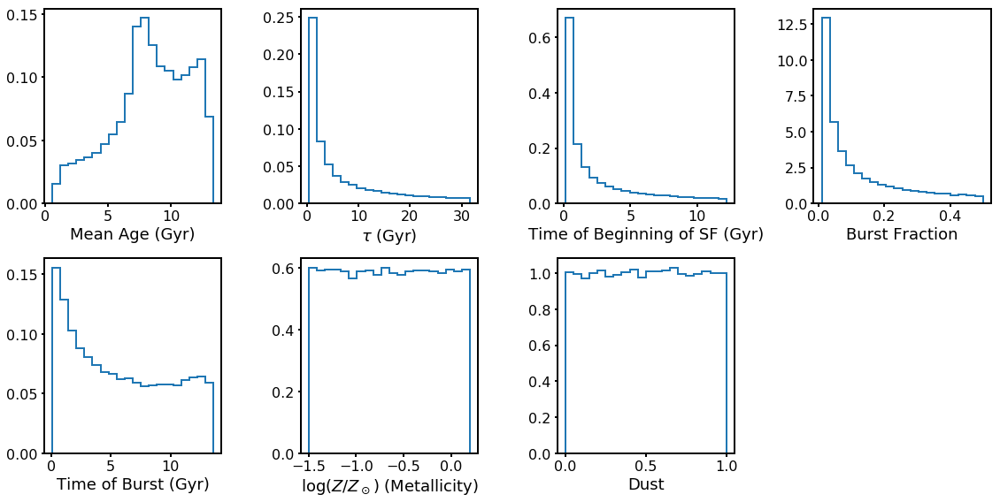

In [6]:
fig, ax = plt.subplots(2,4, figsize=(16,8))
ax = ax.ravel()
ax[0].hist(mean_ages, bins=20, normed=True, histtype='step', linewidth=2)
ax[1].hist(taus, bins=20, normed=True, histtype='step', linewidth=2)
ax[2].hist(sf_begins, bins=20, normed=True, histtype='step', linewidth=2)
ax[3].hist(fbursts, bins=20, normed=True, histtype='step', linewidth=2)
ax[4].hist(tbursts, bins=20, normed=True, histtype='step', linewidth=2)
ax[5].hist(zs, bins=20, normed=True, histtype='step', linewidth=2)
ax[6].hist(dusts, bins=20, normed=True, histtype='step', linewidth=2)
ax[0].set_xlabel('Mean Age (Gyr)')
ax[1].set_xlabel(r'$\tau$ (Gyr)')
ax[2].set_xlabel('Time of Beginning of SF (Gyr)')
ax[3].set_xlabel('Burst Fraction')
ax[4].set_xlabel('Time of Burst (Gyr)')
ax[5].set_xlabel(r'$\log(Z/Z_\odot)$ (Metallicity)')
ax[6].set_xlabel('Dust')
plt.tight_layout()
fig.delaxes(ax[-1])
plt.draw()

### Relationships between SFH parameters, all correlated with mean stellar age

The mean stellar age is intended to summarize the effects of all four SFH paramters that are varied. These plots show how each varied parameter is correlated with the mean stellar age that I calculate.

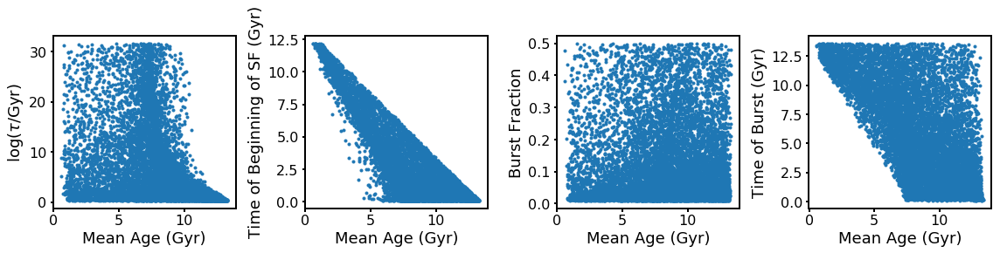

In [7]:
fig, ax = plt.subplots(1,4, figsize=(16,4))
ax[0].plot(mean_ages[:10000], taus[:10000], '.')
ax[1].plot(mean_ages[:10000], sf_begins[:10000], '.')
ax[2].plot(mean_ages[:10000], fbursts[:10000], '.')
ax[3].plot(mean_ages[:10000], tbursts[:10000], '.')
ax[0].set_xlabel('Mean Age (Gyr)')
ax[0].set_ylabel(r'log($\tau$/Gyr)')
ax[1].set_xlabel('Mean Age (Gyr)')
ax[1].set_ylabel('Time of Beginning of SF (Gyr)')
ax[2].set_xlabel('Mean Age (Gyr)')
ax[2].set_ylabel('Burst Fraction')
ax[3].set_xlabel('Mean Age (Gyr)')
ax[3].set_ylabel('Time of Burst (Gyr)')
plt.tight_layout()

## Demonstrating the effect of each parameter on the model galaxy spectrum

Each parameter will have some effect on the overall shape of the spectrum, and some will affect the strength of the absorption line features relative to the level of the continuum. For some parameters, changes will be subtle or negligible for some values but drastic for others, and the impact on a particular spectrum will depend on the values of other parameters. 

E.g., for a spectrum with a small exponential decay timescale for the SFR, $\tau$, low values of $t_{start}$ (the time when star formation begins; low means below ~5 Gyr) are basically indistinguishable, but for higher values, the shape of the spectrum changes drastically. This distinction is less important if $\tau$ is high, because there will still be plenty of ongoing star formation in that case regardless of the time at which star formation began.

This is due to stellar evolution. Basically, the hottest, brightest, bluest stars die off quickly. If there is ongoing star formation, these blue stars will be present and will contribute a lot of light at shorter wavelengths. If the star formation mostly occurred early on and there is little ongoing SF, the blue stars will have died already, and there will be less stellar light at short wavelengths. This strongly affects the overall spectral shape.

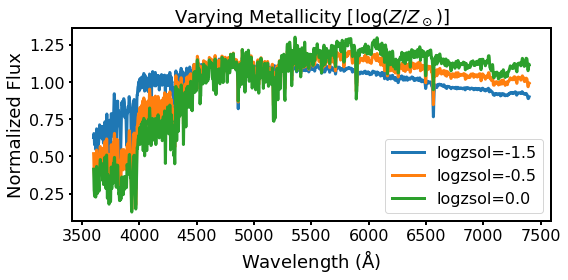

In [77]:
plot_spec_varyparams('logzsol', [-1.5, -0.5, 0.0], r'Varying Metallicity [$\log(Z/Z_\odot)$]')

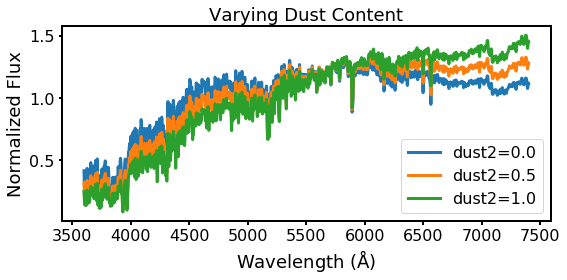

In [78]:
plot_spec_varyparams('dust2', [0.0, 0.5, 1.0], 'Varying Dust Content')

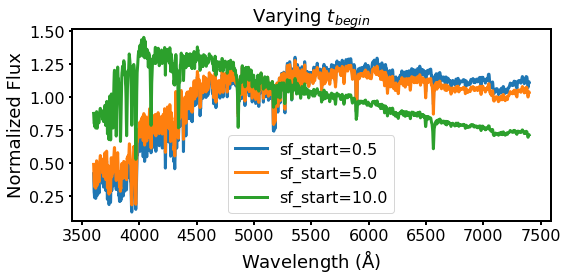

In [81]:
plot_spec_varyparams('sf_start', [0.5, 5.0, 10.0], r'Varying $t_{begin}$')

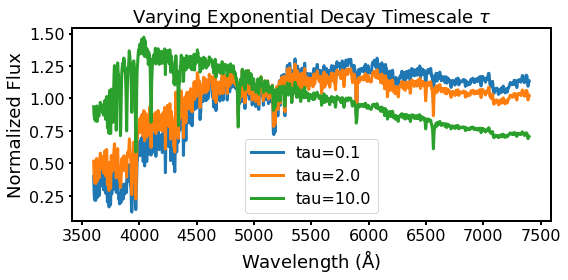

In [84]:
plot_spec_varyparams('tau', [0.1, 2.0, 10.0], r'Varying Exponential Decay Timescale $\tau$')

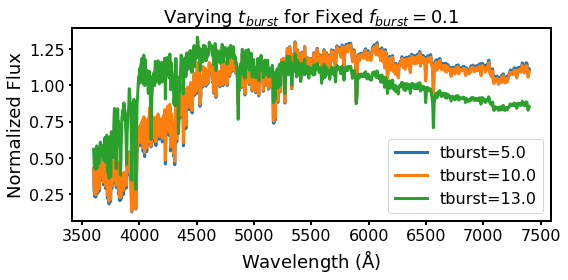

In [91]:
plot_spec_varyparams('tburst', [5.0, 10.0, 13.0], r'Varying $t_{burst}$ for Fixed $f_{burst}=0.1$')

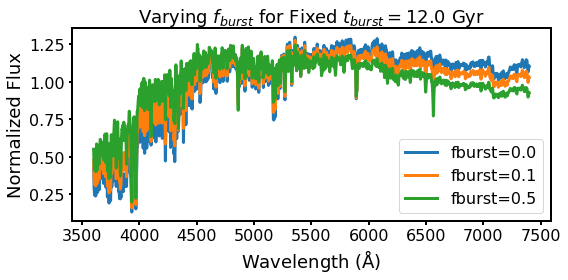

In [94]:
plot_spec_varyparams('fburst', [0.01, 0.1, 0.5], r'Varying $f_{burst}$ for Fixed $t_{burst}=12.0$ Gyr')

### Attempt to choose an optimal radius threshold for this dataset <a id='chooseRadius'></a>

Can't do the dense distance matrix calculation for more than ~10,000 spectra, but the turnover radius doesn't seem to change with sample size and the number of neighbors increases linearly with the size of the dataset, so can use the 10,000 spectra subset to estimate appropriate radius for a larger sample

In [4]:
# do a dense distance matrix for a 10,000 spectrum subset of the data to determine dimensionality, radius

distmatrix = euclidean_distances(spectra[:10000,:])

ns = []
rs = np.logspace(-1.5,1.5,300)

for r in rs:
    test = distmatrix <= r
    neighbors = np.sum(test, axis=0) 
    ns.append(np.mean(neighbors) - 1.)  # account for one 0 per row (distance to self)

for radius 0.03, 0 < N_neightbors < 2, mean = 0.00, log(N)=-2.42
for radius 0.07, 0 < N_neightbors < 2, mean = 0.04, log(N)=-1.43
for radius 0.15, 0 < N_neightbors < 7, mean = 0.45, log(N)=-0.35
for radius 0.32, 0 < N_neightbors < 28, mean = 4.76, log(N)=0.68
for radius 0.68, 0 < N_neightbors < 144, mean = 44.57, log(N)=1.65
for radius 1.47, 0 < N_neightbors < 812, mean = 337.30, log(N)=2.53
for radius 3.16, 2 < N_neightbors < 2252, mean = 1420.22, log(N)=3.15
for radius 6.81, 68 < N_neightbors < 4624, mean = 3521.37, log(N)=3.55
for radius 14.68, 872 < N_neightbors < 8764, mean = 6805.77, log(N)=3.83
for radius 31.62, 6431 < N_neightbors < 9999, mean = 9869.56, log(N)=3.99


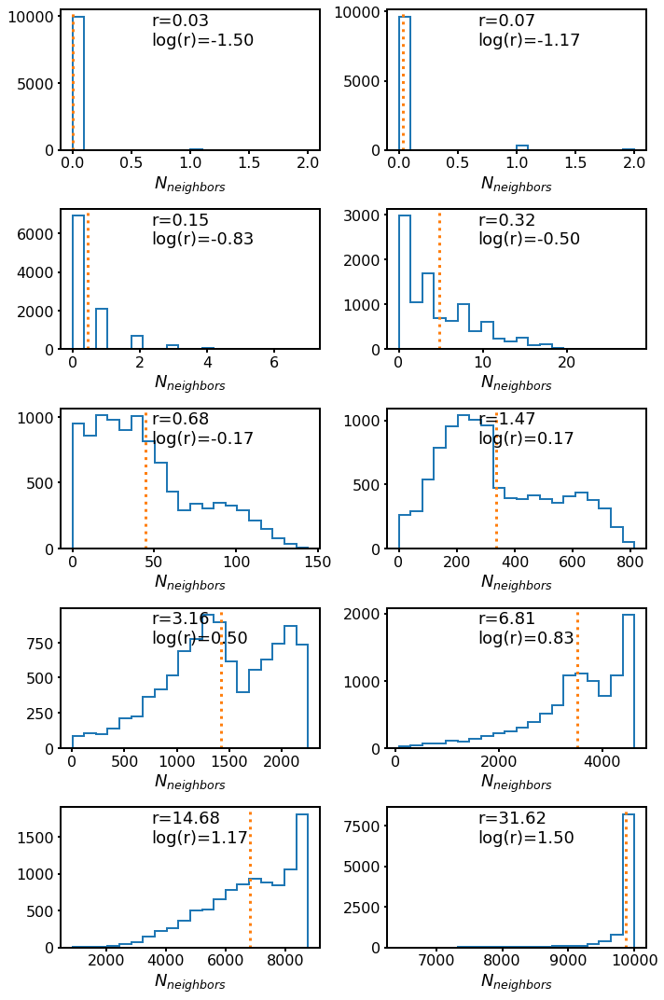

In [33]:
rs = np.logspace(-1.5,1.5,10)
ns = []
stdevs = []
min_ns = []
max_ns = []
fig, ax = plt.subplots(5,2, figsize=(10,15))
ax = ax.ravel()
for ii in range(len(rs)):
    test = distmatrix <= rs[ii]
    neighbors = np.sum(test, axis=0) - 1  # account for one 0 per row (distance to self)
    print 'for radius %.2f, %d < N_neightbors < %d, mean = %.2f, log(N)=%.2f' % (rs[ii], np.min(neighbors), 
                                                                    np.max(neighbors), np.mean(neighbors),
                                                                                np.log10(np.mean(neighbors)))
    stdevs.append(np.std(neighbors))
    ns.append(np.mean(neighbors))
    min_ns.append(np.min(neighbors))
    max_ns.append(np.max(neighbors))
    n, bins, patches = ax[ii].hist(neighbors, bins=20, histtype='step', linewidth=2)
    ax[ii].axvline(np.mean(neighbors), linestyle=':', color='C1')
    ax[ii].set_xlabel(r'$N_{neighbors}$');
    ax[ii].text(0.35, 0.75, 'r=%.2f\nlog(r)=%.2f' % (rs[ii], np.log10(rs[ii])), \
                transform=ax[ii].transAxes, fontsize=18, fontdict={'color': 'black'})
    plt.tight_layout()

In [34]:
logr = np.log10(rs)
logn = np.log10(ns)
logmin = np.log10(min_ns)
logmax = np.log10(max_ns)
whfit = logr < 0.1  # chose upper limit of the linear regime after looking at plot. only do fit below this log(r)

/Users/Grace/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:3: RuntimeWarning: divide by zero encountered in log10
  app.launch_new_instance()


In [35]:
# fit a quick line to linear part -- get dimension of data
from scipy.optimize import curve_fit

def f(x, A, B):
    return A*x + B

A, B = curve_fit(f, logr[whfit], logn[whfit])[0]
print "The dimension of the data is", A

The dimension of the data is 3.07517736207


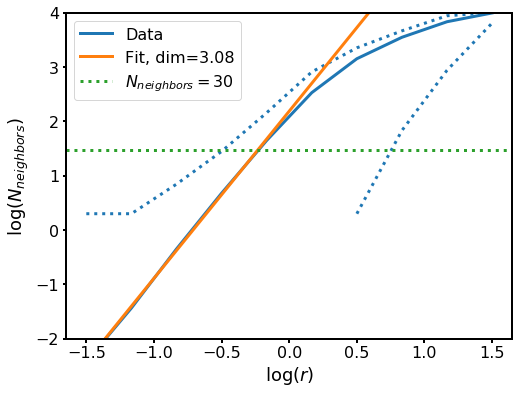

In [36]:
plt.figure(figsize=(8,6));
plt.plot(logr, logn, label='Data');
plt.plot(logr, logmin, ':', c='C0')
plt.plot(logr, logmax, ':', c='C0')
plt.xlabel(r'$\log(r)$');
plt.ylabel(r'$\log(N_{neighbors})$');
plt.plot(logr, f(logr, A, B), label='Fit, dim=%.2f' % A);
# plt.axvline(0.1, linestyle=':', color='k') # threshold below which linear fit was performed, log(r) = 0.1
plt.axhline(np.log10(30), linestyle=':', color='C2', label=r'$N_{neighbors}=30$')  # where N_neighbors = 30
plt.ylim(-2,4);
plt.legend()

In [32]:
targetN = 30
idx = (np.abs(logn - np.log10(targetN))).argmin()
print 'N=%d neighbors at log(r)=%.2f. 2x this radius gives log(r)=%.2f.' % (targetN, logr[idx], 
                                                                            np.log10(10**logr[idx] * 2))
print 10**-0.23, 10**0.08, 10**0.5

N=30 neighbors at log(r)=-0.17. 2x this radius gives log(r)=0.13.
0.588843655356 1.20226443462 3.16227766017


#### My understanding is that we want to choose log(r) such that $N_{neighbors}$ is roughly 30, because we think the dimension of the dataset is 3. And we want to choose a slightly larger log(r) because the kernel width is r/3. 

#### So I'll take as 'optimal' 2x the radius that gives $N_{neighbors}=30$. Though that radius, log(r)=0.08, seems to be just beyond the linear regime...

## Now, we do the embedding with this "optimal" radius...  2x radius where N=30 for 10,000 spectra <a id='optimalRadiusEmbed'></a>

Doing this for 8 dimensions, since the log(N) vs. log(r) plot suggests a dimension of 3 or maybe 4.

The keywords used here were all suggested to me by James McQueen; these are the parameters he used to generate the embedding of the 0.3M Sloan Digital Sky Survey galaxy spectra.

In [30]:
radius = 10**0.08
adjacency_method = 'cyflann'
cyflann_kwds = {'index_type':'kdtrees', 'num_trees':100}
adjacency_kwds = {'radius':radius, 'cyflann_kwds':cyflann_kwds}
affinity_method = 'gaussian'
affinity_kwds = {'radius':radius}

geom = Geometry(adjacency_method=adjacency_method, adjacency_kwds=adjacency_kwds, 
                affinity_method=affinity_method, affinity_kwds=affinity_kwds)

geom.set_data_matrix(spectra[:10000,:])
adjacency_matrix = geom.compute_adjacency_matrix()
affinity_matrix = geom.compute_affinity_matrix()

new_radius = np.max(adjacency_matrix.data)
print new_radius

affinity_kwds = {'radius':new_radius}
laplacian_method = 'geometric'
laplacian_kwds = {'scaling_epps':new_radius}  # make this radius ~5 times smaller
geom.affinity_kwds = affinity_kwds
geom.laplacian_method = laplacian_method
geom.laplacian_kwds = laplacian_kwds

ndim=8
spectral = SpectralEmbedding(n_components=ndim, eigen_solver='amg', drop_first=True, geom=geom)
embed = spectral.fit_transform(geom.X)

1.20225


In [31]:
# get the number of components
n, labels = connected_components(affinity_matrix, directed=False, return_labels=True)
print n,'components\n', np.sum(labels==0), 'spectra in first component'
wh = labels == 0
use_embed = embed[wh,:] * 1000

26 components
9961 spectra in first component


## Plot first dimension vs. all the others and color code by mean stellar age, because I expect this to *generally* be a good indicator of overall spectral shape. Look for any kind of information content in the embedding.

I've only plotted dimension 0 vs. all other dimensions here, because all other projections are equally uninformative... It's just a blob of points, with some kind of variation in the color-coded parameters, but nothing coherent. 

**Question: is this to be expected from an embedding done at a reasonable radius? What does this result say to you about next steps? Increase/decrease radius cutoff, use a different method, use a bigger dataset?**

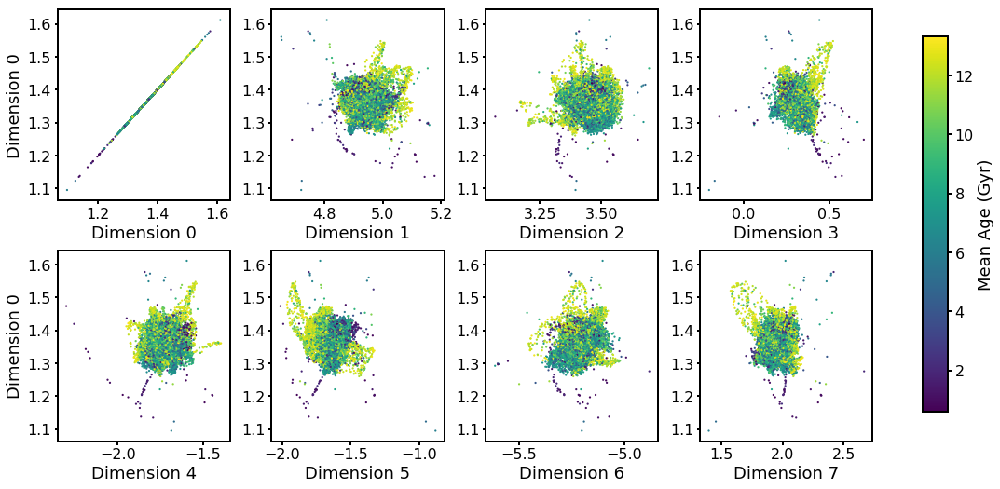

In [34]:
plot_vsdim_cc(ndim, use_embed[:,0], mean_ages[:10000][wh], ylabel='Dimension 0', cblabel='Mean Age (Gyr)')

### Plot mean stellar age vs. each dimension and color-code by the 6 parameters varied in model generation

These plots do not reveal any correlations between the varied parameters and any of the embedding dimensions.

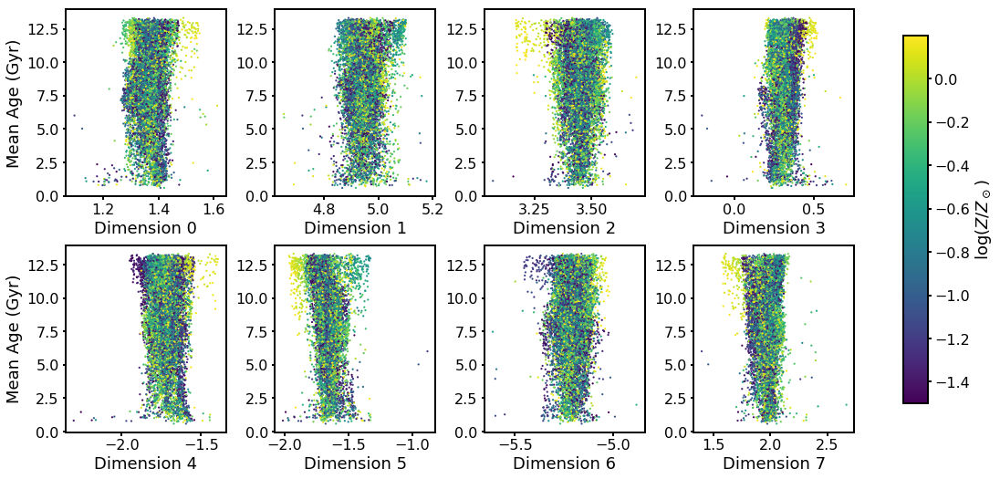

In [40]:
plot_vsdim_cc(ndim, mean_ages[:10000][wh], zs[:10000][wh], ylabel='Mean Age (Gyr)', cblabel=r'$\log(Z/Z_\odot)$')

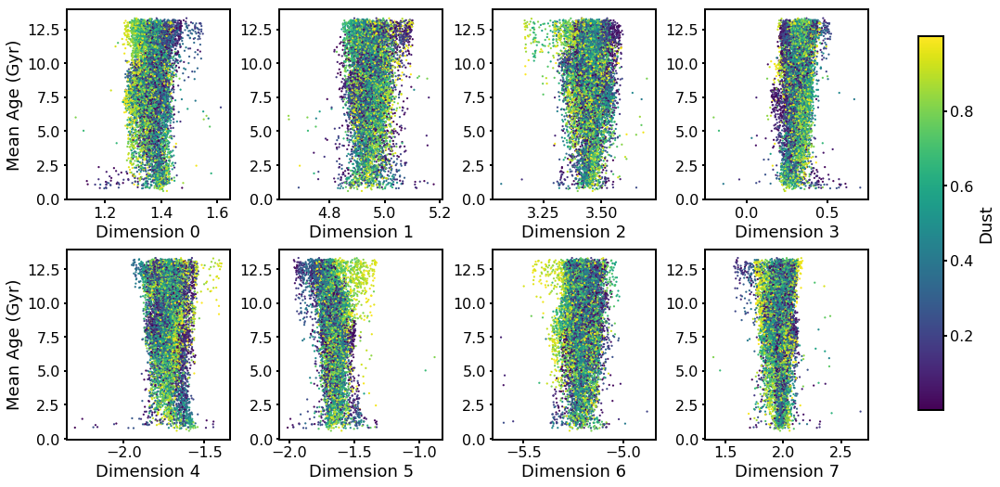

In [41]:
plot_vsdim_cc(ndim, mean_ages[:10000][wh], dusts[:10000][wh], ylabel='Mean Age (Gyr)', cblabel='Dust')

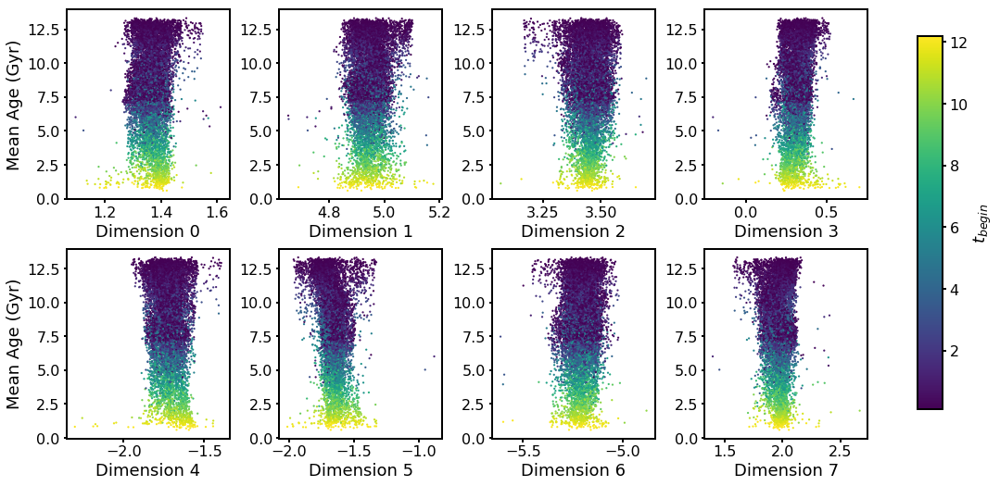

In [42]:
plot_vsdim_cc(ndim, mean_ages[:10000][wh], sf_begins[:10000][wh], ylabel='Mean Age (Gyr)', cblabel=r'$t_{begin}$')

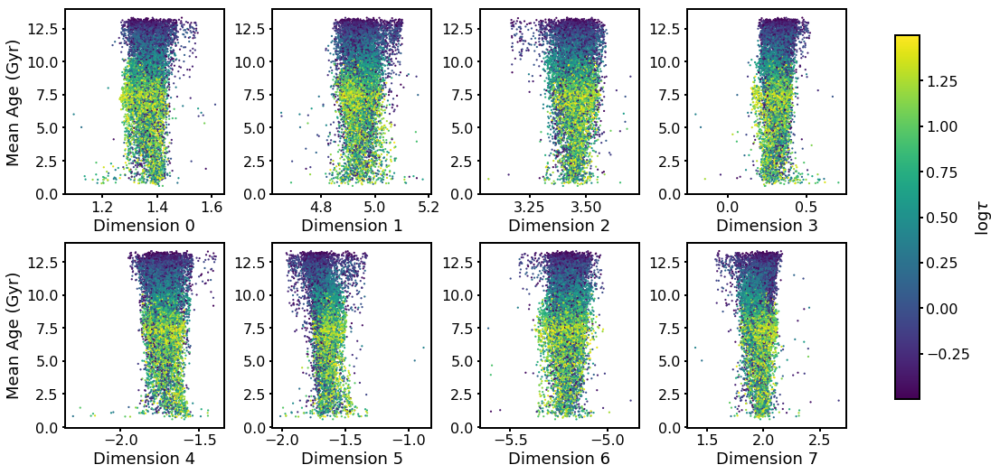

In [43]:
plot_vsdim_cc(ndim, mean_ages[:10000][wh], np.log10(taus[:10000][wh]), ylabel='Mean Age (Gyr)', cblabel=r'$\log \tau$')

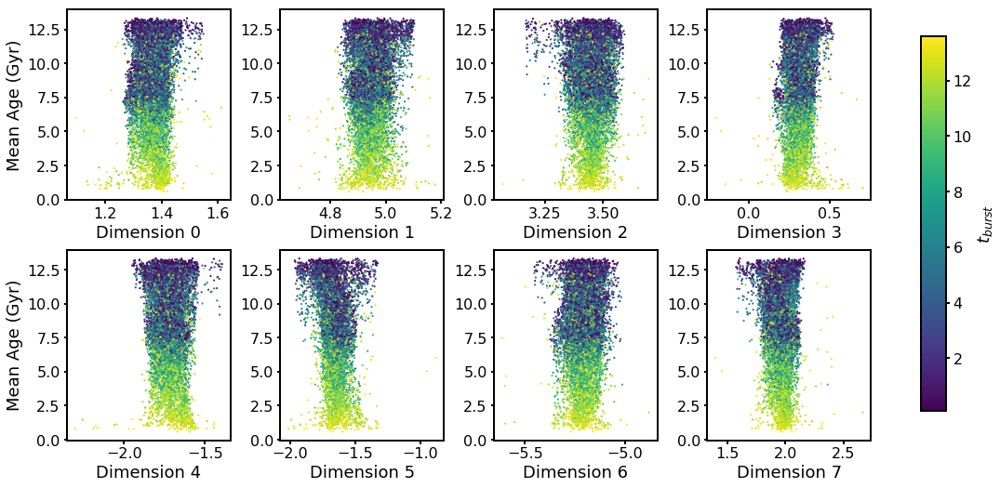

In [45]:
plot_vsdim_cc(ndim, mean_ages[:10000][wh], tbursts[:10000][wh], ylabel='Mean Age (Gyr)', cblabel=r'$t_{burst}$')

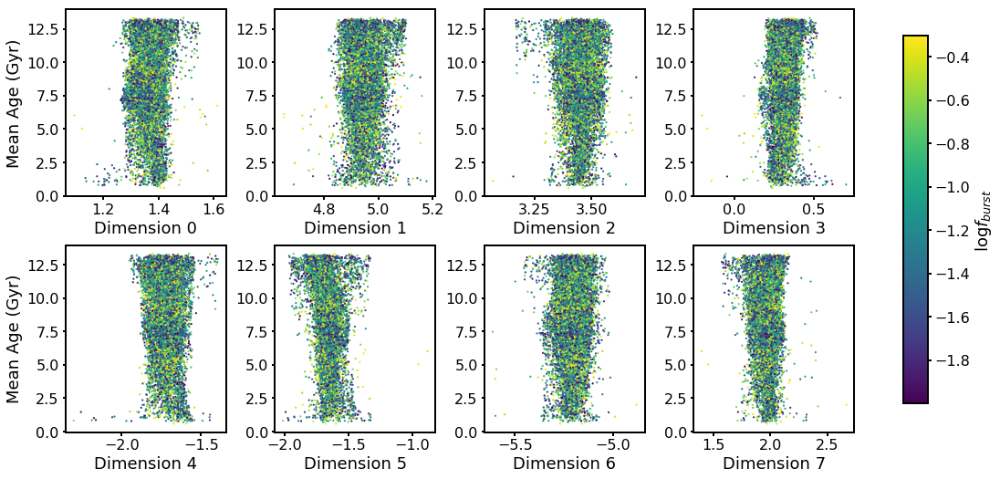

In [47]:
plot_vsdim_cc(ndim, mean_ages[:10000][wh], np.log10(fbursts[:10000][wh]), ylabel='Mean Age (Gyr)', cblabel=r'$\log f_{burst}$')

## Try a large radius: log(r)=0.75, definitely not in the linear regime <a id='bigRadius'></a>
### UPDATE: this is the radius where all spectra have *at least* 30 neighbors -- possibly more appropriate?

In [57]:
radius = 10**0.75
adjacency_method = 'cyflann'
cyflann_kwds = {'index_type':'kdtrees', 'num_trees':100}  # 
adjacency_kwds = {'radius':radius, 'cyflann_kwds':cyflann_kwds}
affinity_method = 'gaussian'
affinity_kwds = {'radius':radius}

geom = Geometry(adjacency_method=adjacency_method, adjacency_kwds=adjacency_kwds, 
                affinity_method=affinity_method, affinity_kwds=affinity_kwds)

geom.set_data_matrix(spectra[:10000,:])
adjacency_matrix = geom.compute_adjacency_matrix()
affinity_matrix = geom.compute_affinity_matrix()

new_radius = np.max(adjacency_matrix.data)
print new_radius

affinity_kwds = {'radius':new_radius}
laplacian_method = 'geometric'
laplacian_kwds = {'scaling_epps':new_radius}
geom.affinity_kwds = affinity_kwds
geom.laplacian_method = laplacian_method
geom.laplacian_kwds = laplacian_kwds

ndim=30
spectral = SpectralEmbedding(n_components=ndim, eigen_solver='amg', drop_first=True, geom=geom)
embed = spectral.fit_transform(geom.X)

5.61358


In [87]:
affinity_matrix.data.shape  # can convert this to a dense matrix and check out the distribution of n_neighbors

(426394,)

In [68]:
# get the number of components
n, labels = connected_components(affinity_matrix, directed=False, return_labels=True)
print n,'components\n', np.sum(labels==0), 'spectra in first component'
wh = labels == 0
use_embed_init = embed[wh,:] * 1000

1 components
10000 spectra in first component


In [83]:
use_embed = np.delete(use_embed_init, (1,2,3,4,5,6), 1)
use_dim = use_embed.shape[1]

## Plot dimensions 0, 1, 2 against others and look for structure.

For this larger radius, the graph is fully connected. Now, dimension 0 does seem to be at least a bit correlated with mean stellar age. This looks like the "higher order harmonics" that in the embeddings I shared with Marina and Jake at the end of 2016. Only in the 8th dimension do we see any kind of structure that might be meaningful...

**Question: what does it mean that there are so many of these harmonics? Is this expected, or is this saying something about the appropriateness of the method for this data set?**

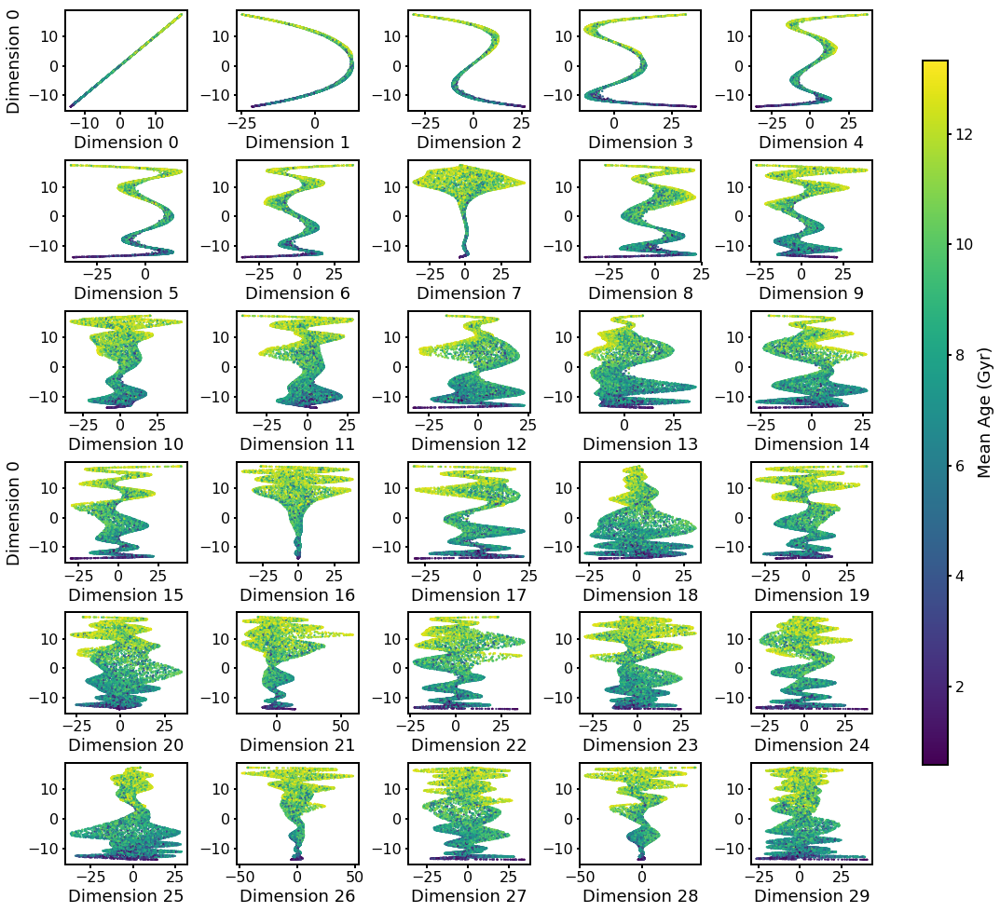

In [79]:
plot_vsdim_cc(ndim, use_embed[:,0], mean_ages[:10000][wh], ylabel='Dimension 0', cblabel='Mean Age (Gyr)', \
              use_embed=use_embed_init)

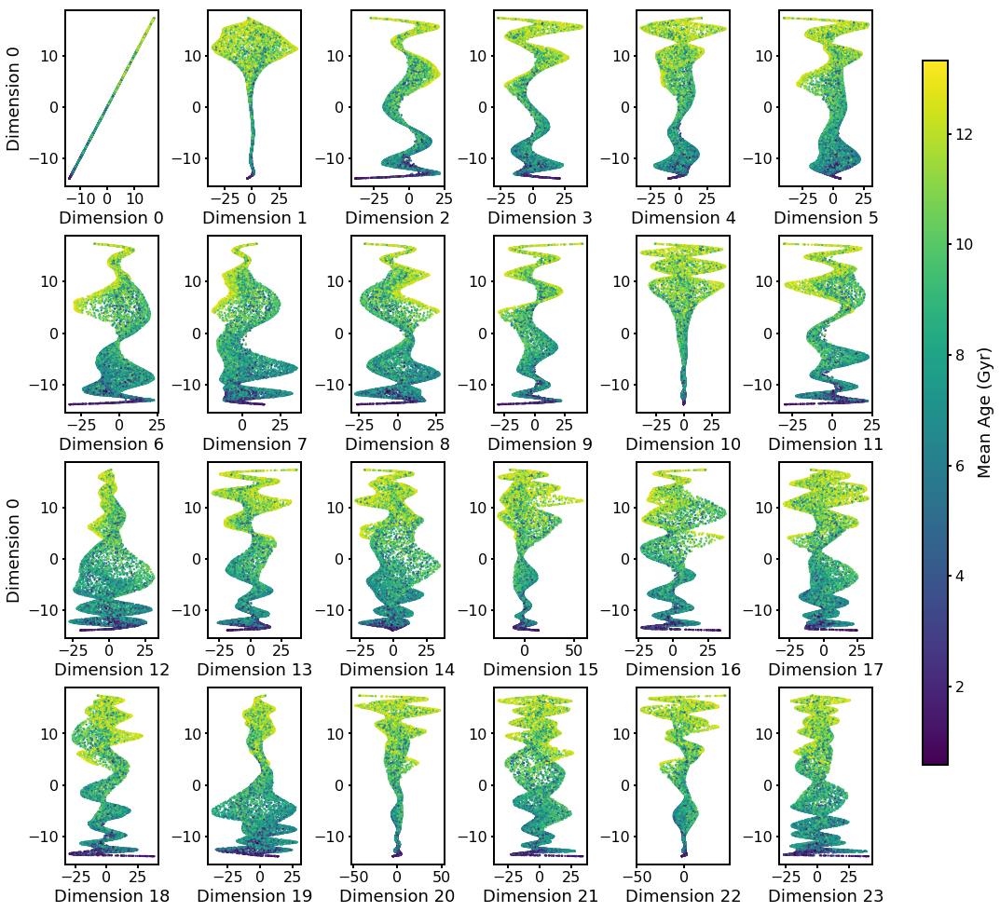

In [84]:
plot_vsdim_cc(use_dim, use_embed[:,0], mean_ages[:10000][wh], ylabel='Dimension 0', cblabel='Mean Age (Gyr)', \
              use_embed=use_embed)

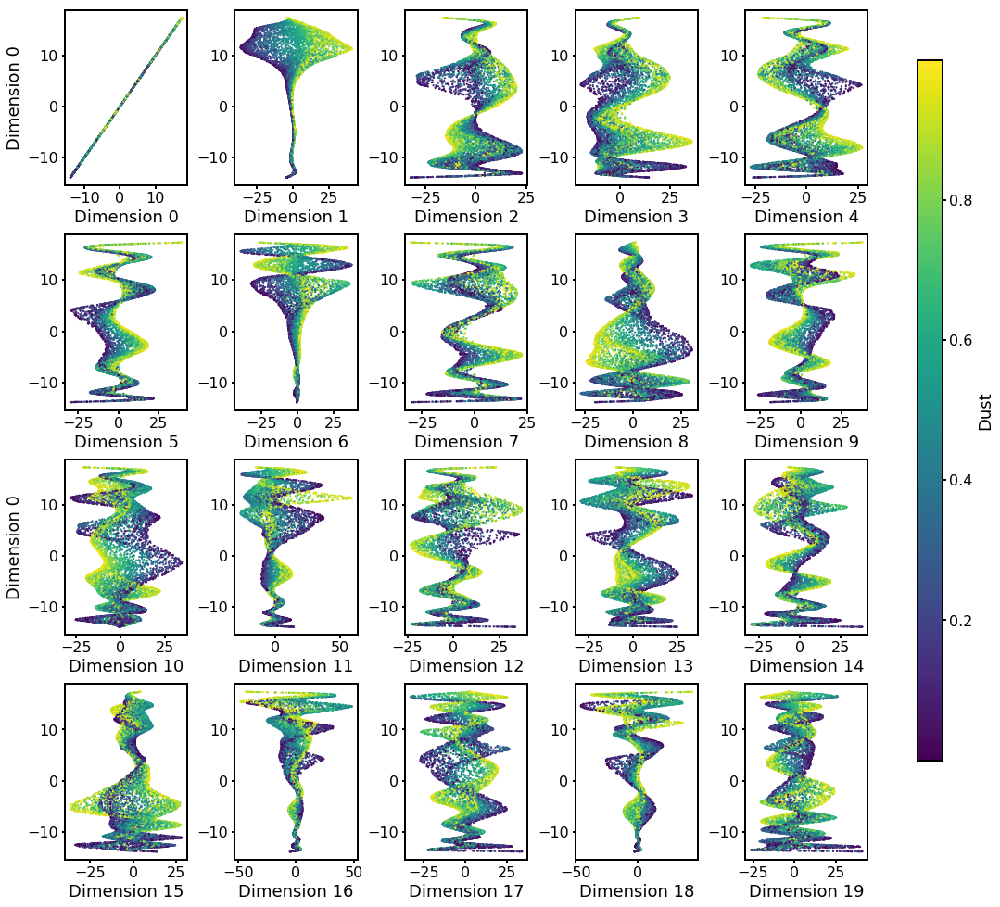

In [81]:
plot_vsdim_cc(use_dim, use_embed[:,0], dusts[:10000][wh], ylabel='Dimension 0', cblabel='Dust', \
              use_embed=use_embed)

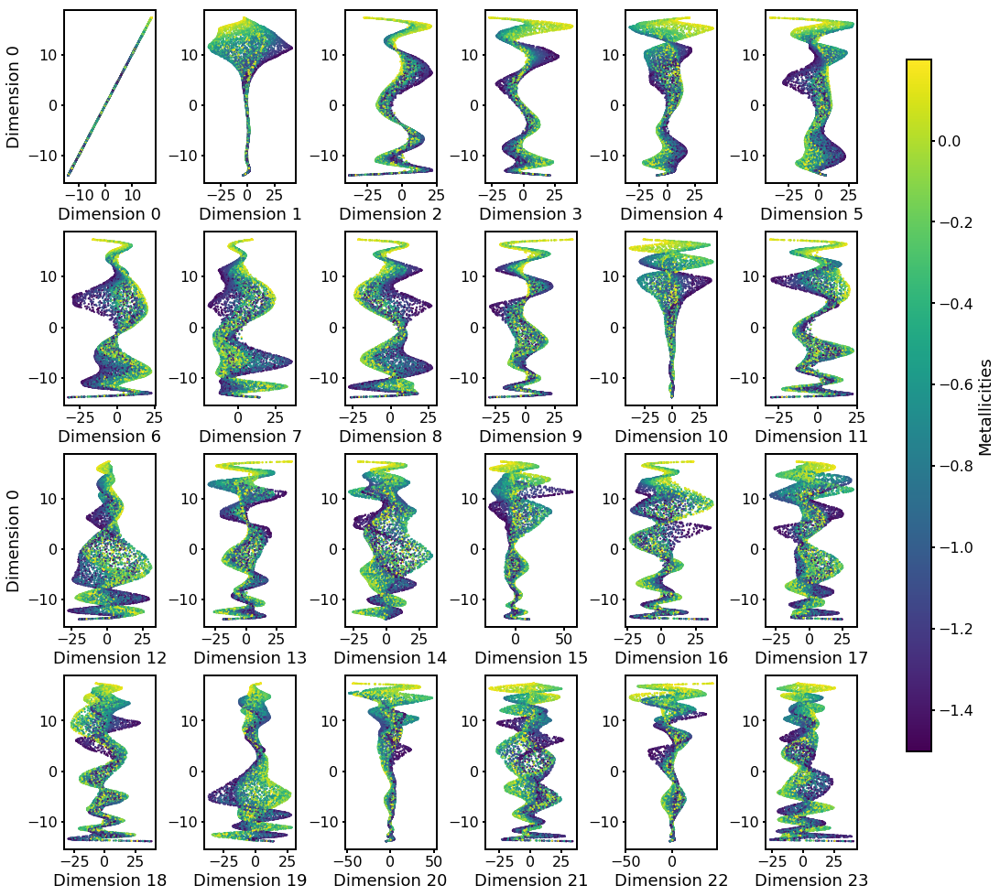

In [85]:
plot_vsdim_cc(use_dim, use_embed[:,0], zs[:10000][wh], ylabel='Dimension 0', cblabel='Metallicities', \
              use_embed=use_embed)

### Plot mean stellar age vs. each dimension and color-code by the 6 parameters varied in model generation

Dimension 0 seems to know something about $\tau$, and maybe dust and/or metallicity in different regimes of high or low $\tau$. Dimension 1 maybe knows something about dust for the younger spectra? Dimension 7 seems to know about dust and metallicity for older mean ages.

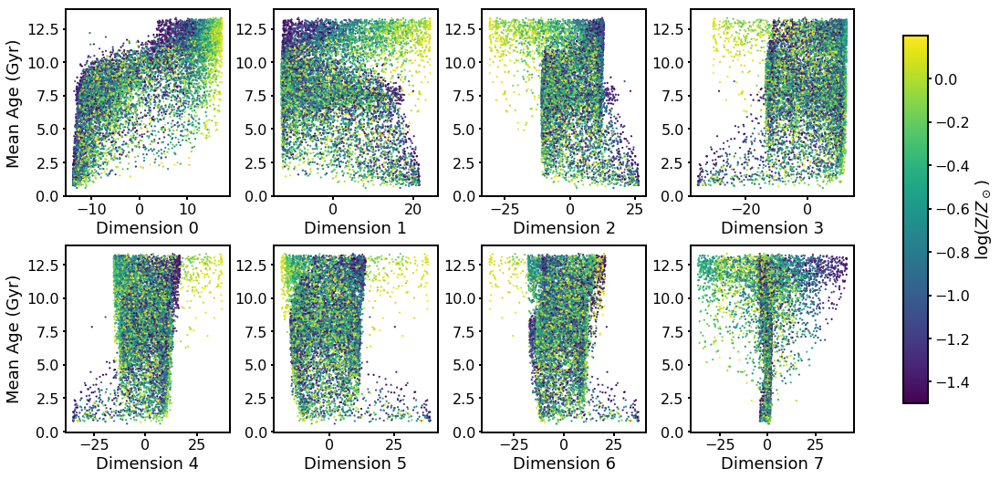

In [45]:
plot_vsdim_cc(ndim, mean_ages[:10000][wh], zs[:10000][wh], ylabel='Mean Age (Gyr)', cblabel=r'$\log(Z/Z_\odot)$', use_embed=use_embed)

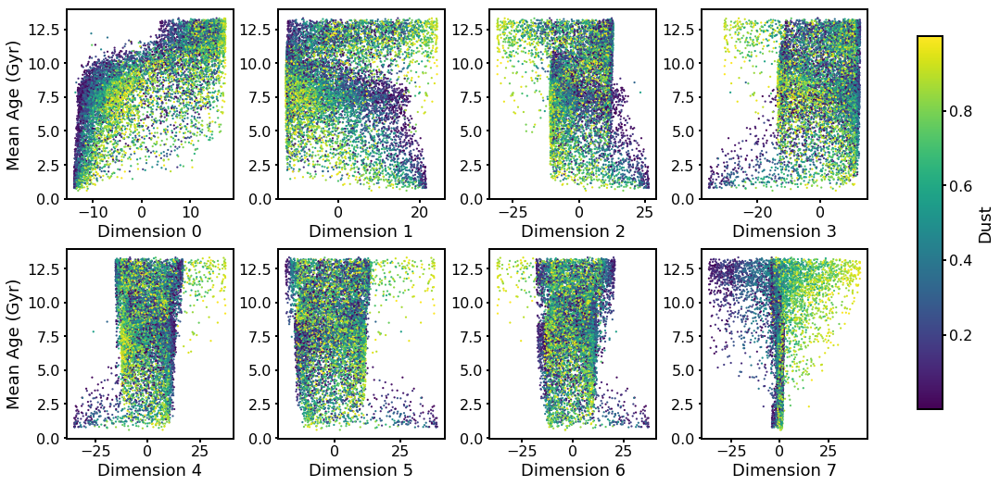

In [46]:
plot_vsdim_cc(ndim, mean_ages[:10000][wh], dusts[:10000][wh], ylabel='Mean Age (Gyr)', cblabel='Dust', use_embed=use_embed)

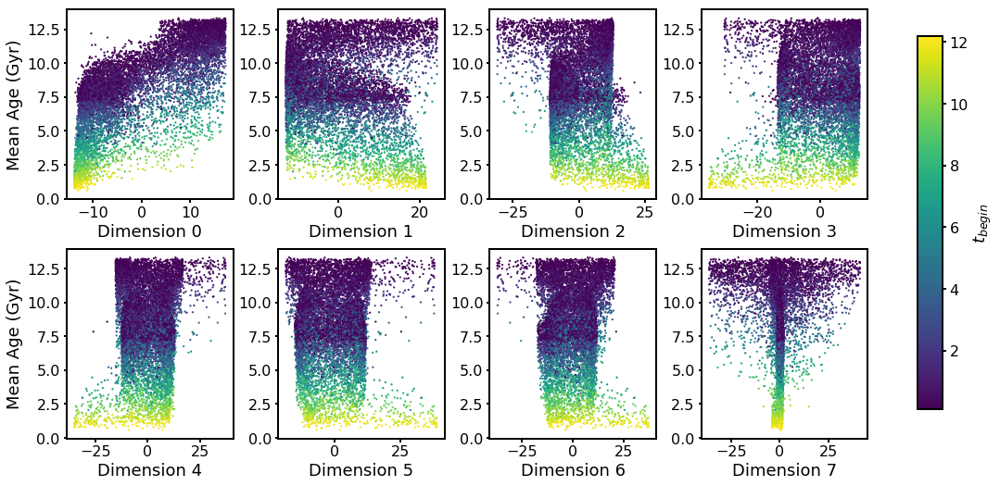

In [47]:
plot_vsdim_cc(ndim, mean_ages[:10000][wh], sf_begins[:10000][wh], ylabel='Mean Age (Gyr)', cblabel=r'$t_{begin}$', use_embed=use_embed)

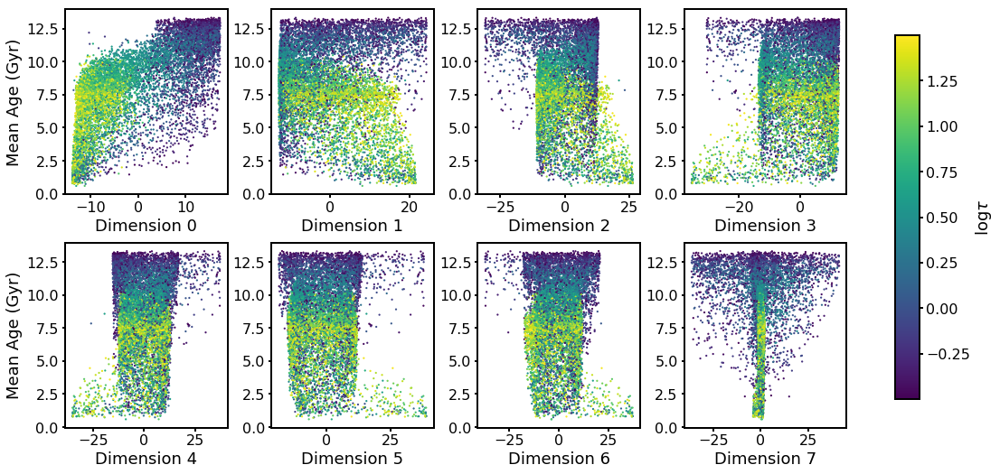

In [49]:
plot_vsdim_cc(ndim, mean_ages[:10000][wh], np.log10(taus[:10000][wh]), ylabel='Mean Age (Gyr)', cblabel=r'$\log \tau$', use_embed=use_embed)

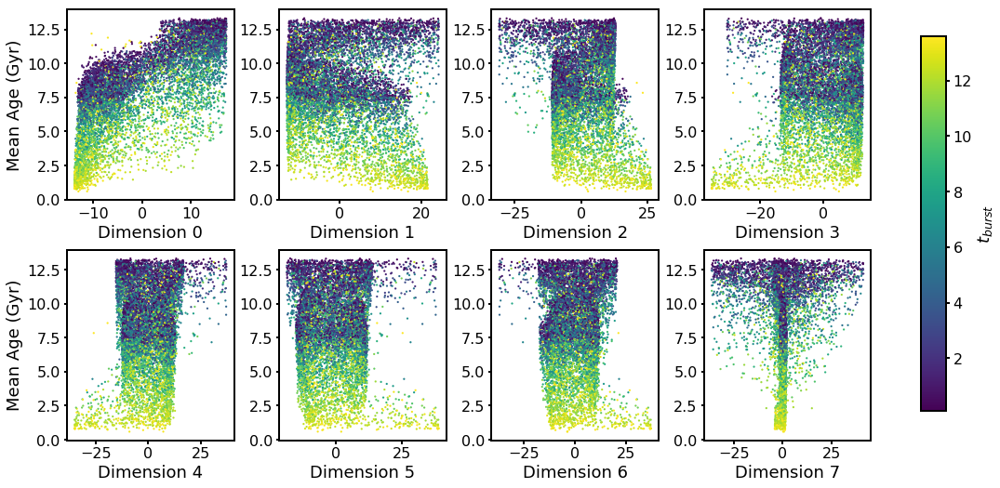

In [50]:
plot_vsdim_cc(ndim, mean_ages[:10000][wh], tbursts[:10000][wh], ylabel='Mean Age (Gyr)', cblabel=r'$t_{burst}$', use_embed=use_embed)

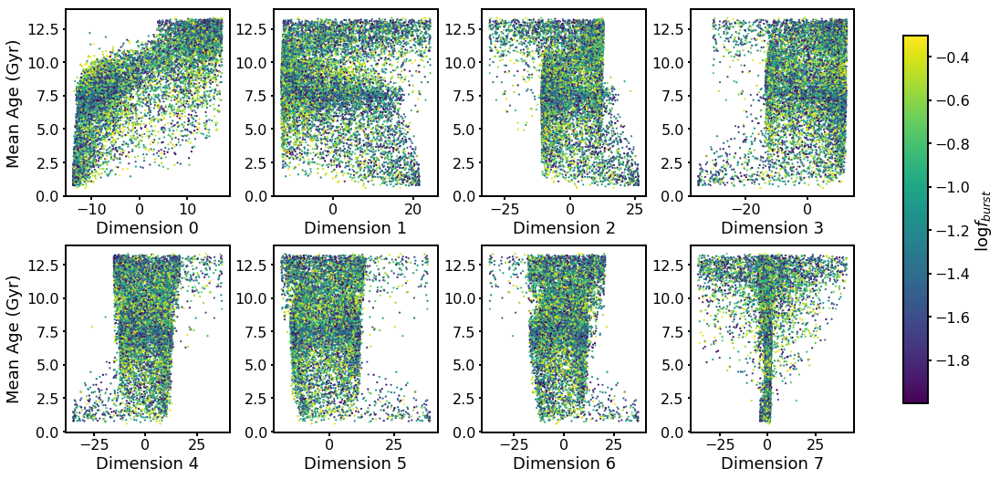

In [51]:
plot_vsdim_cc(ndim, mean_ages[:10000][wh], np.log10(fbursts[:10000][wh]), ylabel='Mean Age (Gyr)', \
              cblabel=r'$\log f_{burst}$', use_embed=use_embed)

## Try embedding 100,000 spectra with a large radius -- is this any more informative? <a id='embedBigRadiusBigSample'></a>

In [8]:
radius = 10**0.5
adjacency_method = 'cyflann'
cyflann_kwds = {'index_type':'kdtrees', 'num_trees':100}
adjacency_kwds = {'radius':radius, 'cyflann_kwds':cyflann_kwds}
affinity_method = 'gaussian'
affinity_kwds = {'radius':radius}

geom = Geometry(adjacency_method=adjacency_method, adjacency_kwds=adjacency_kwds, 
                affinity_method=affinity_method, affinity_kwds=affinity_kwds)

geom.set_data_matrix(spectra)
adjacency_matrix = geom.compute_adjacency_matrix()
affinity_matrix = geom.compute_affinity_matrix()

new_radius = np.max(adjacency_matrix.data)
print new_radius

affinity_kwds = {'radius':new_radius}
laplacian_method = 'geometric'
laplacian_kwds = {'scaling_epps':new_radius}
geom.affinity_kwds = affinity_kwds
geom.laplacian_method = laplacian_method
geom.laplacian_kwds = laplacian_kwds

ndim=8
spectral = SpectralEmbedding(n_components=ndim, eigen_solver='amg', drop_first=True, geom=geom)
embed = spectral.fit_transform(geom.X)

3.16227


In [9]:
# get the number of components
n, labels = connected_components(affinity_matrix, directed=False, return_labels=True)
print n,'components\n', np.sum(labels==0), 'spectra in first component'
wh = labels == 0
use_embed = embed[wh,:] * 1000

1 components
100000 spectra in first component


## Plot dimension 0 against others and look for structure.

Now, with the better populated plots, the basic embedding recovered is similar, but now it looks like there is a small amount of meaningful structure even in dimensions 1-6... information about dust and metallicity in dimension 7 much more obvious now

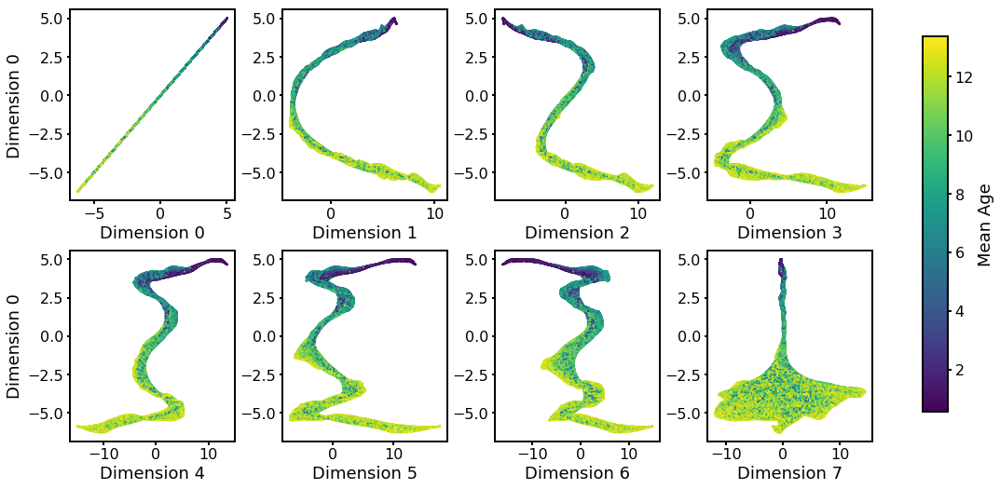

In [12]:
plot_vsdim_cc(ndim, use_embed[:,0], mean_ages[wh], ylabel='Dimension 0', cblabel='Mean Age', use_embed=use_embed)

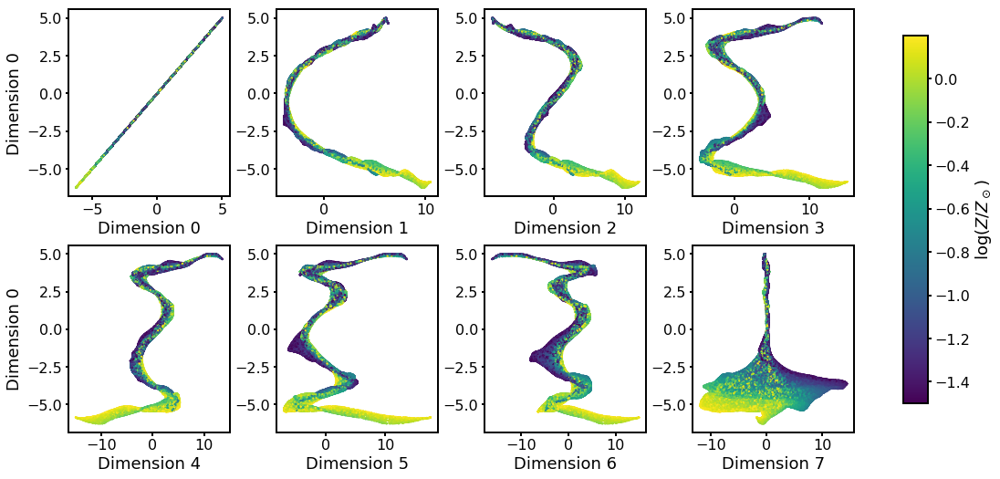

In [13]:
plot_vsdim_cc(ndim, use_embed[:,0], zs[wh], ylabel='Dimension 0', cblabel=r'$\log(Z/Z_\odot)$', use_embed=use_embed)

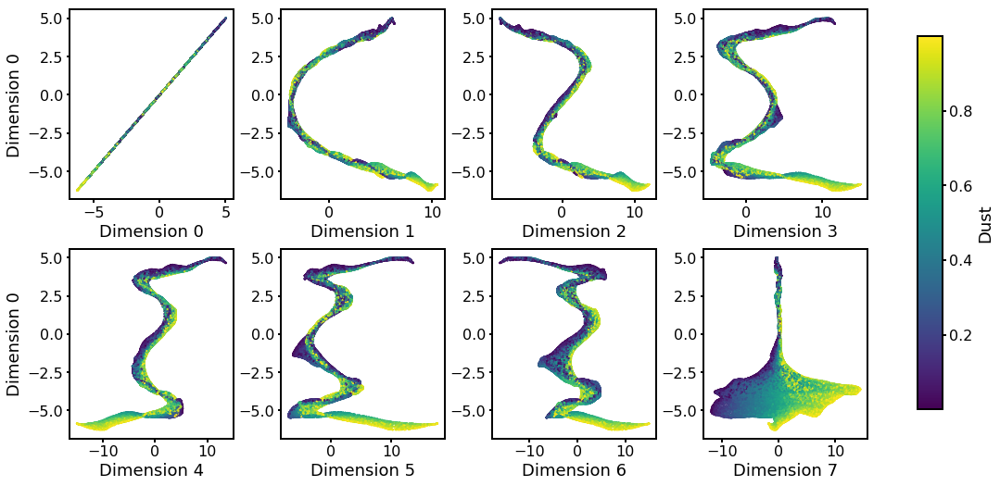

In [14]:
plot_vsdim_cc(ndim, use_embed[:,0], dusts[wh], ylabel='Dimension 0', cblabel='Dust', use_embed=use_embed)

## Try computing an embedding for 100,000 spectra with the 'optimal' radius, log(r)=-0.5 <a id='embedOptimalRadiusBigSample'></a>

The keywords and methods used to calculate the embedding are all following what James McQueen used to embed 0.3M Sloan Digital Sky Survey galaxy spectra. I have not experimented thoroughly with any other keywords or methods. I'm using Spectral Embedding and a radius cutoff.

This is roughly the radius where $N_{neighbors}=3$ for 10,000 spectra, so 30 for 100,000 spectra. This ends up looking qualitatively similar to the embedding calculated with a large radius cutoff above.

Note: I tried going down to log(r)=-1.0, but this resulted in 59844 components with only 3 spectra in first component

In [ ]:
# Did not use this because I'm not 100% sure that it's working correctly

# # Try James's method of quickly re-computing distance matrix with a smaller radius threshold
# print 'Old maximum radius', np.max(adjacency_matrix.data)
# rmax = 10**-0.5
# print 'New maximum radius', rmax
# adjacency_matrix.data[adjacency_matrix.data > rmax] = 0 
# adjacency_matrix.eliminate_zeros()
# geom.set_adjacency_matrix(adjacency_matrix)
# affinity_matrix = geom.compute_affinity_matrix()
# embed2 = spectral.fit_transform(geom.X)

In [98]:
radius = 10**-0.5
adjacency_method = 'cyflann'
cyflann_kwds = {'index_type':'kdtrees', 'num_trees':100}
adjacency_kwds = {'radius':radius, 'cyflann_kwds':cyflann_kwds}
affinity_method = 'gaussian'
affinity_kwds = {'radius':radius}

geom = Geometry(adjacency_method=adjacency_method, adjacency_kwds=adjacency_kwds, 
                affinity_method=affinity_method, affinity_kwds=affinity_kwds)

geom.set_data_matrix(spectra)
adjacency_matrix = geom.compute_adjacency_matrix()
affinity_matrix = geom.compute_affinity_matrix()

new_radius = np.max(adjacency_matrix.data)
print new_radius

affinity_kwds = {'radius':new_radius}
laplacian_method = 'geometric'
laplacian_kwds = {'scaling_epps':new_radius}
geom.affinity_kwds = affinity_kwds
geom.laplacian_method = laplacian_method
geom.laplacian_kwds = laplacian_kwds

ndim=8
spectral = SpectralEmbedding(n_components=ndim, eigen_solver='amg', drop_first=True, geom=geom)
embed = spectral.fit_transform(geom.X)

0.316227


In [99]:
# get the number of components
n, labels = connected_components(affinity_matrix, directed=False, return_labels=True)
print n,'components\n', np.sum(labels==0), 'spectra in first component'
wh2 = labels == 0
use_embed2 = embed2[wh2,:] * 1000

4987 components
93629 spectra in first component


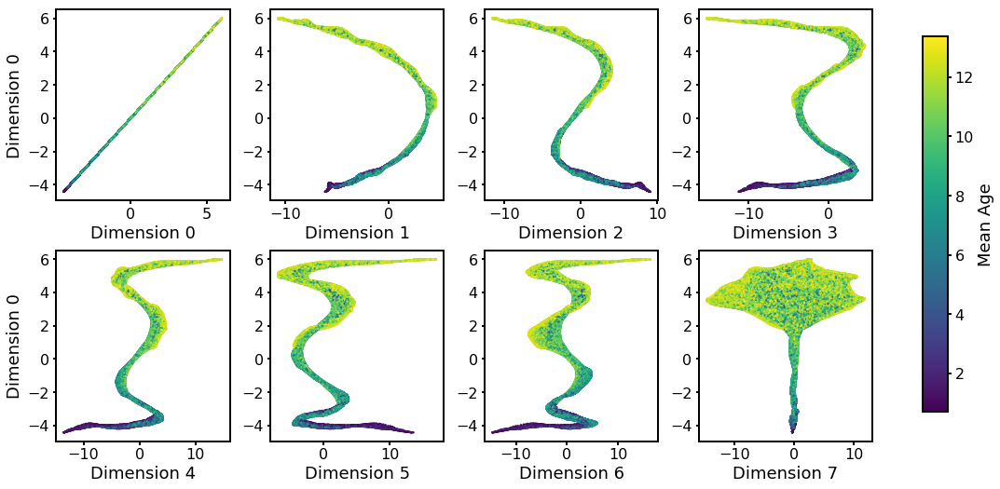

In [100]:
plot_vsdim_cc(ndim, use_embed2[:,0], mean_ages[wh2], ylabel='Dimension 0', cblabel='Mean Age', use_embed=use_embed2)

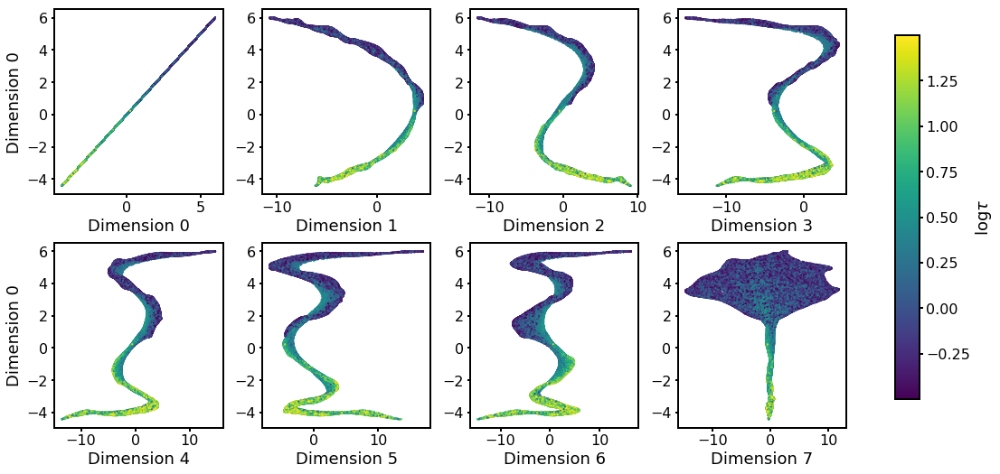

In [115]:
plot_vsdim_cc(ndim, use_embed2[:,0], np.log10(taus[wh2]), ylabel='Dimension 0', cblabel=r'$\log \tau$', use_embed=use_embed2)

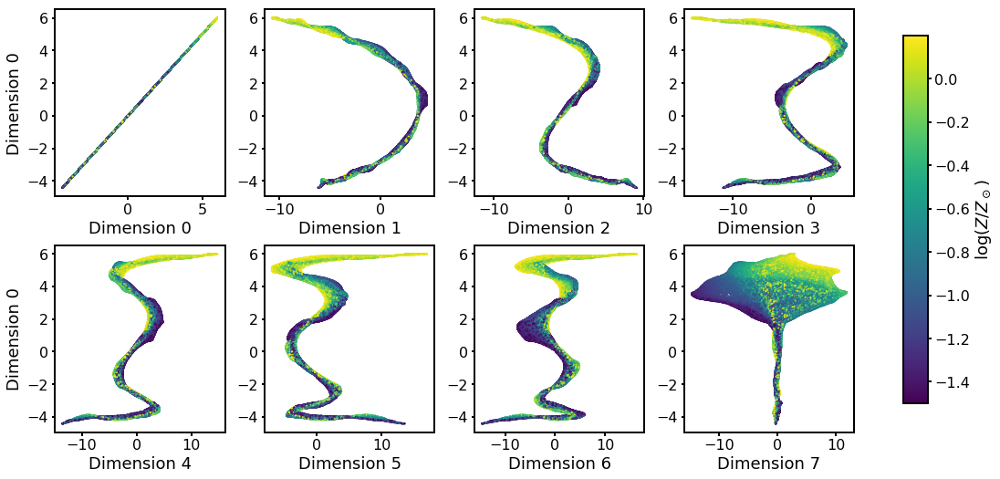

In [101]:
plot_vsdim_cc(ndim, use_embed2[:,0], zs[wh2], ylabel='Dimension 0', cblabel=r'$\log(Z/Z_\odot)$', use_embed=use_embed2)

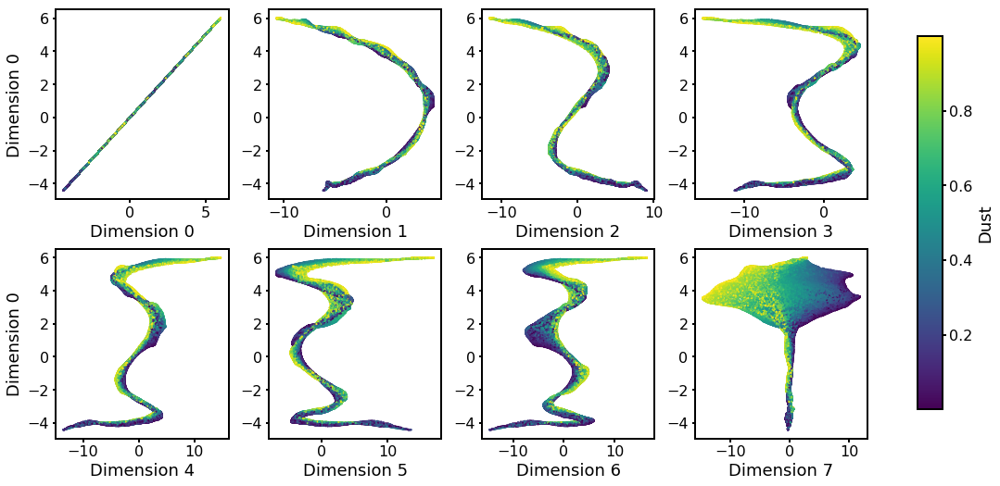

In [102]:
plot_vsdim_cc(ndim, use_embed2[:,0], dusts[wh2], ylabel='Dimension 0', cblabel='Dust', use_embed=use_embed2)

## Try plotting dust, metallicity, $\tau$, mean age vs. all dimensions and color-code by other parameters -- just getting a better sense of what kind of structure is present

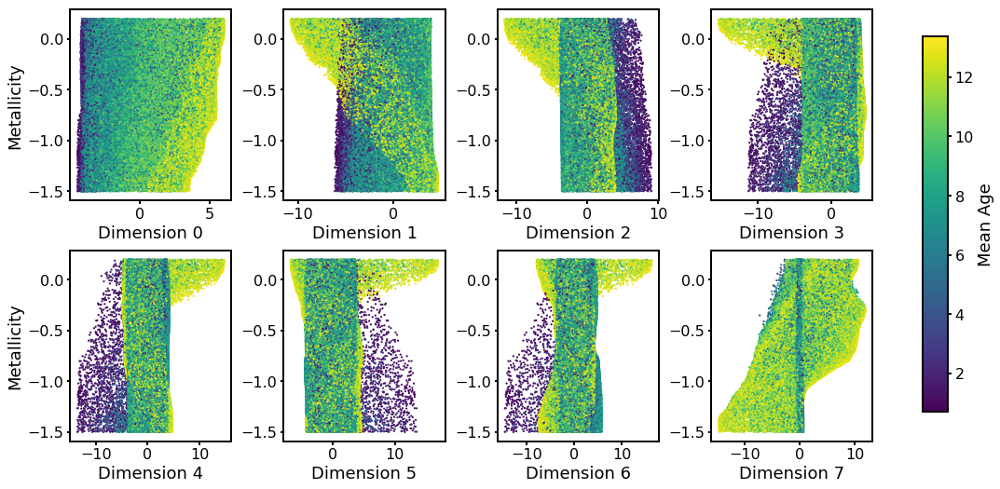

In [114]:
plot_vsdim_cc(ndim, zs[wh2], mean_ages[wh2], ylabel='Metallicity', cblabel='Mean Age', use_embed=use_embed2)

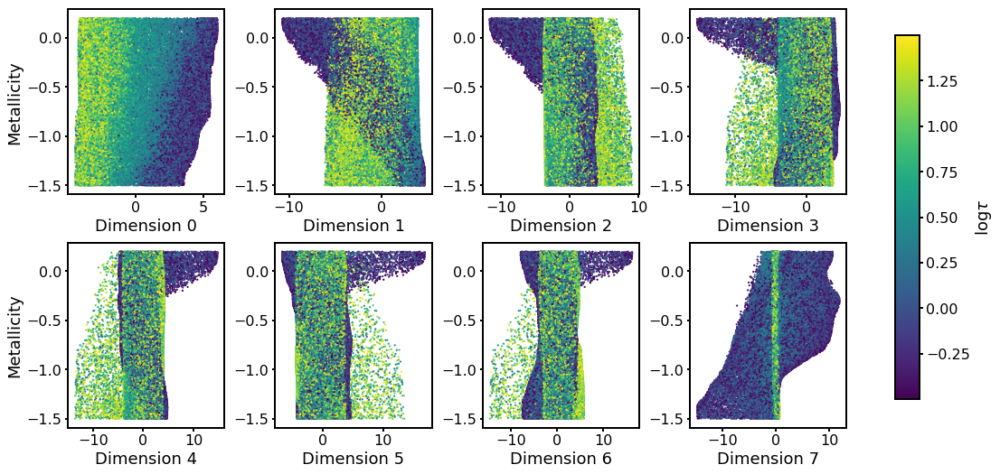

In [112]:
plot_vsdim_cc(ndim, zs[wh2], np.log10(taus[wh2]), ylabel='Metallicity', cblabel=r'$\log \tau$', use_embed=use_embed2)

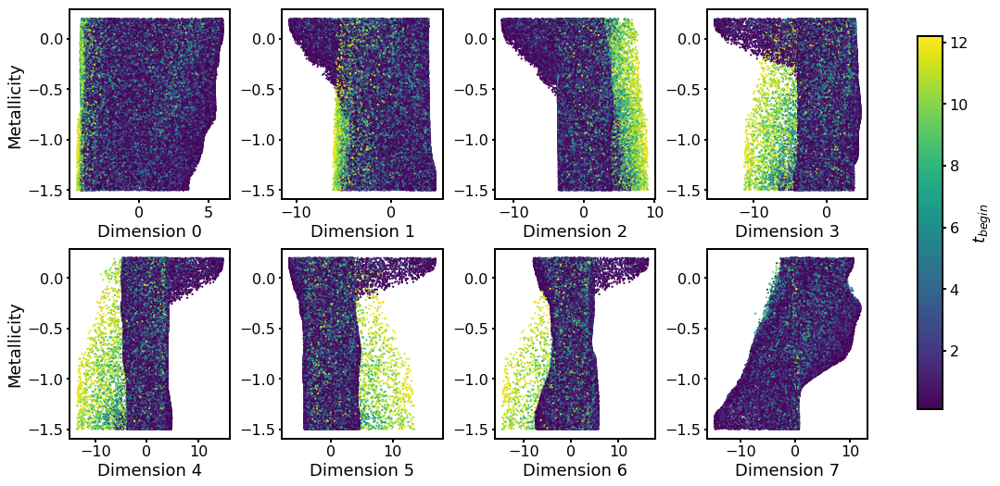

In [116]:
plot_vsdim_cc(ndim, zs[wh2], sf_begins[wh2], ylabel='Metallicity', cblabel=r'$t_{begin}$', use_embed=use_embed2)

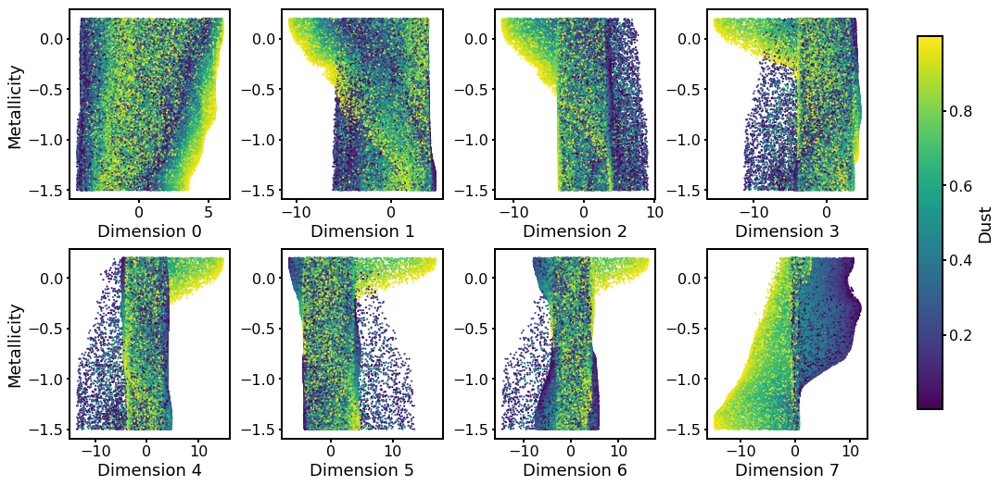

In [111]:
plot_vsdim_cc(ndim, zs[wh2], dusts[wh2], ylabel='Metallicity', cblabel='Dust', use_embed=use_embed2)

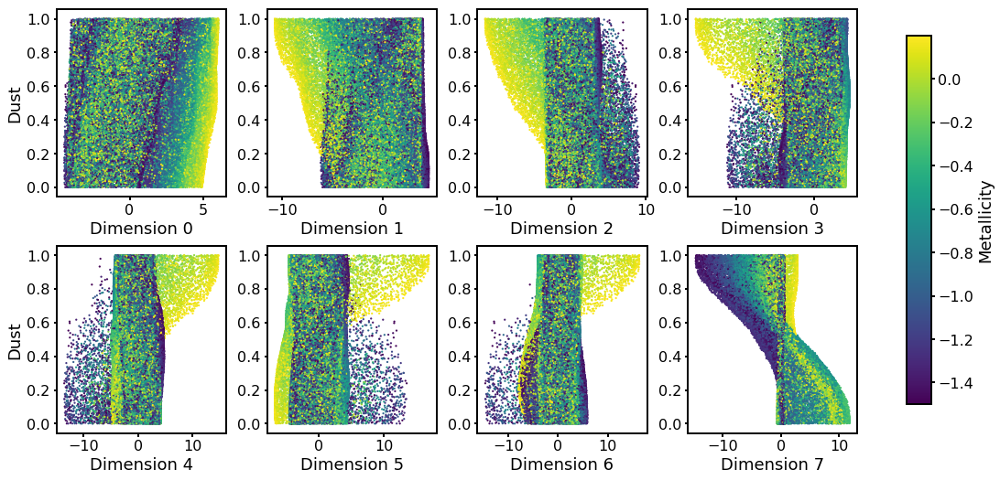

In [109]:
plot_vsdim_cc(ndim, dusts[wh2], zs[wh2], ylabel='Dust', cblabel='Metallicity', use_embed=use_embed2)

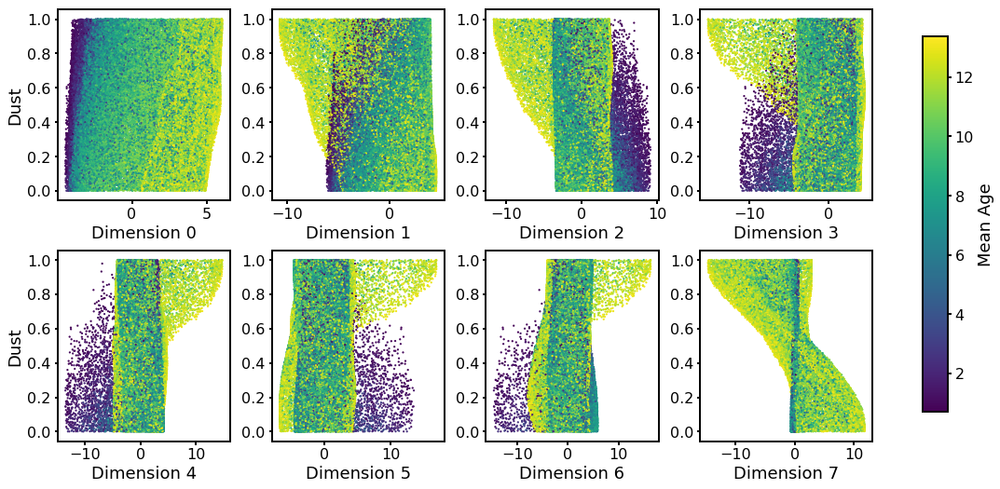

In [119]:
plot_vsdim_cc(ndim, dusts[wh2], mean_ages[wh2], ylabel='Dust', cblabel='Mean Age', use_embed=use_embed2)

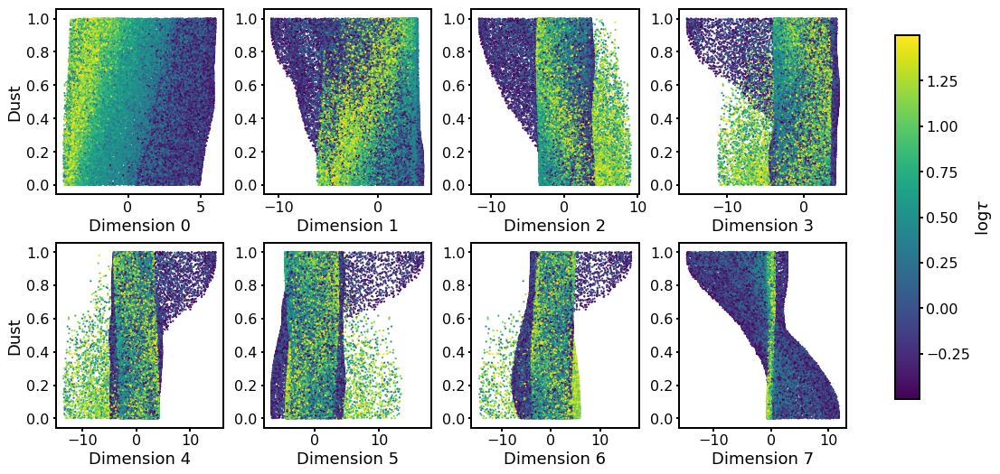

In [110]:
plot_vsdim_cc(ndim, dusts[wh2], np.log10(taus[wh2]), ylabel='Dust', cblabel=r'$\log \tau$', use_embed=use_embed2)

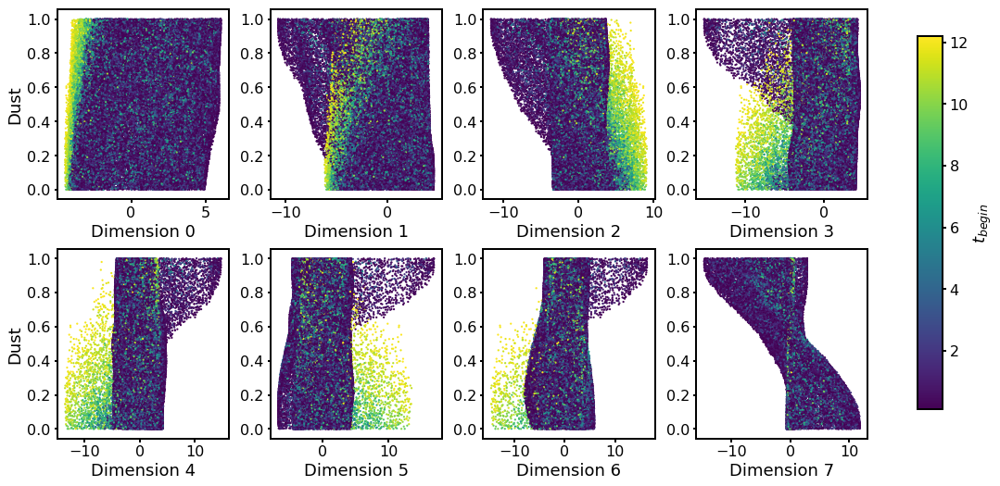

In [122]:
plot_vsdim_cc(ndim, dusts[wh2], sf_begins[wh2], ylabel='Dust', cblabel=r'$t_{begin}$', use_embed=use_embed2)

## Takeaways from this exercise:
### Seems to me like most dimensions encode some information about multiple parameters
### Dim 0 is mainly age/$\tau$; Dim 7 is some combination of dust and metallicity for old mean ages, but knows nothing about properties of young models; other dimensions seem to pull out spectra with extreme SFHs (very small $\tau$, very recent (large) $t_{begin}$), but this is only obvious when another parameter is known
### The "fanned out" part of dimension 7 captures metallicity and dust information. But what's going on in the tail? Looks like models with young mean stellar ages are preferentially located there.

## Make log(N) vs. log(r) plot for young models only <a id='youngModels'></a>

Does the "tail" of young galaxies evident in dimension 7 in the embedding have a different dimension?

In [29]:
# do a dense distance matrix for a 10,000 spectrum subset of the data to determine dimensionality, radius
youngspectra = spectra[mean_ages < 5.0]
print np.shape(youngspectra)

distmatrix = euclidean_distances(youngspectra)

ns = []
rs = np.logspace(-1.5,1.5,300)

for r in rs:
    test = distmatrix <= r
    neighbors = np.sum(test, axis=0) 
    ns.append(np.mean(neighbors) - 1.)  # account for one 0 per row (distance to self)

(14896, 4220)


In [30]:
logr = np.log10(rs)
logn = np.log10(ns)
whfit = logr < 0.1  # chose upper limit of the linear regime after looking at plot. only do fit below this log(r)

In [31]:
# fit a quick line to linear part -- get dimension of data
from scipy.optimize import curve_fit

def f(x, A, B):
    return A*x + B

A, B = curve_fit(f, logr[whfit], logn[whfit])[0]
print "The dimension of the data is", A

The dimension of the data is 3.51149217677


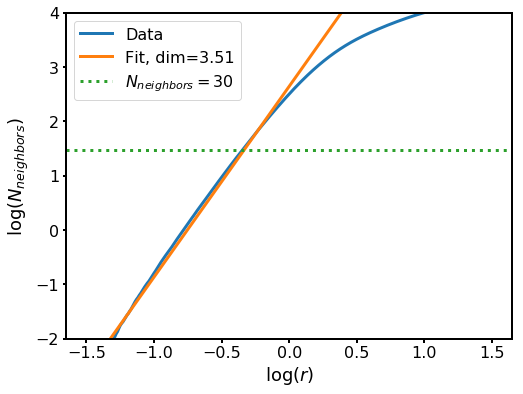

In [32]:
plt.figure(figsize=(8,6));
plt.plot(logr, logn, label='Data');
plt.xlabel(r'$\log(r)$');
plt.ylabel(r'$\log(N_{neighbors})$');
plt.plot(logr, f(logr, A, B), label='Fit, dim=%.2f' % A);
# plt.axvline(0.1, linestyle=':', color='k') # threshold below which linear fit was performed, log(r) = 0.1
plt.axhline(np.log10(30), linestyle=':', color='C2', label=r'$N_{neighbors}=30$')  # where N_neighbors = 30
plt.ylim(-2,4);
plt.legend()

In [33]:
targetN = 30
idx = (np.abs(logn - np.log10(targetN))).argmin()
print 'N=%d neighbors at log(r)=%.2f. 2x this radius gives log(r)=%.2f.' % (targetN, logr[idx], 
                                                                            np.log10(10**logr[idx] * 2))

N=30 neighbors at log(r)=-0.35. 2x this radius gives log(r)=-0.05.


### Huh! So the dimension is different for this subset of data. Maybe it's the distinction between being young because of a recent burst vs. due to a relatively constant SFH?

## What does this cut on mean age select for? What SFH parameters drive this?

Blue lines show histograms in each SFH related parameter for the full sample; orange are for these young mean age model galaxy spectra.

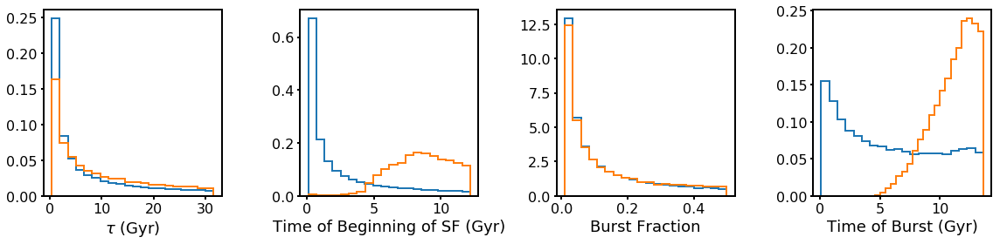

In [64]:
fig, ax = plt.subplots(1,4, figsize=(16,4))
ax[0].hist(taus, bins=20, normed=True, histtype='step', linewidth=2)
ax[0].hist(taus[mean_ages < 5.0], bins=20, normed=True, histtype='step', linewidth=2)

ax[1].hist(sf_begins, bins=20, normed=True, histtype='step', linewidth=2)
ax[1].hist(sf_begins[mean_ages < 5.0], bins=20, normed=True, histtype='step', linewidth=2)

ax[2].hist(fbursts, bins=20, normed=True, histtype='step', linewidth=2)
ax[2].hist(fbursts[mean_ages < 5.0], bins=20, normed=True, histtype='step', linewidth=2)

ax[3].hist(tbursts, bins=20, normed=True, histtype='step', linewidth=2)
ax[3].hist(tbursts[mean_ages < 5.0], bins=20, normed=True, histtype='step', linewidth=2)

ax[0].set_xlabel(r'$\tau$ (Gyr)')
ax[1].set_xlabel('Time of Beginning of SF (Gyr)')
ax[2].set_xlabel('Burst Fraction')
ax[3].set_xlabel('Time of Burst (Gyr)')
plt.tight_layout()
plt.draw()

### So, young mean stellar age models have late onset of star formation and late bursts of star formation relative to the full sample. The latter is built in to the way the modeling was done; every star formation history has a burst at some point between the beginning of star formation and the present day, so if $t_{begin}$ is late, the $t_{burst}$ will be late too. However, $f_{burst}$ is preferentially small, so a late burst will not necessarily change the spectrum much.

## Now try embedding this subset of models with log(r)=0.5 and see if things look interesting... <a id='radiusBigYoungModels'></a>

Note: tried using the 'optimal' radius, log(r) = -0.05, and embedding in 8 and 10 dimensions. Just got plots that look like the attempt at using the 'optimal' radius for the 10,000 spectra dataset above -- weird blobs with no useful structure.

Here, used a large radius again and recover a similar pattern. One dimension seems to cause points to fan out and is sensitive to metallicity and dust. There is still a tail in dimension 6 here, but the tail contains older mean stellar ages, unlike the embedding for the full sample, where the tail contains all the models with younger ages.

In [54]:
radius = 10**0.5  
adjacency_method = 'cyflann'
cyflann_kwds = {'index_type':'kdtrees', 'num_trees':100}
adjacency_kwds = {'radius':radius, 'cyflann_kwds':cyflann_kwds}
affinity_method = 'gaussian'
affinity_kwds = {'radius':radius}

geom = Geometry(adjacency_method=adjacency_method, adjacency_kwds=adjacency_kwds, 
                affinity_method=affinity_method, affinity_kwds=affinity_kwds)

geom.set_data_matrix(youngspectra)
adjacency_matrix = geom.compute_adjacency_matrix()
affinity_matrix = geom.compute_affinity_matrix()

new_radius = np.max(adjacency_matrix.data)
print new_radius

affinity_kwds = {'radius':new_radius}
laplacian_method = 'geometric'
laplacian_kwds = {'scaling_epps':new_radius}
geom.affinity_kwds = affinity_kwds
geom.laplacian_method = laplacian_method
geom.laplacian_kwds = laplacian_kwds

ndim=8
spectral = SpectralEmbedding(n_components=ndim, eigen_solver='amg', drop_first=True, geom=geom)
embedyoung = spectral.fit_transform(geom.X)

3.16025


In [55]:
# get the number of components
n, labels = connected_components(affinity_matrix, directed=False, return_labels=True)
print n,'components\n', np.sum(labels==0), 'spectra in first component'
whyoung = labels == 0
use_embedyoung = embedyoung[whyoung,:] * 1000

1 components
14896 spectra in first component


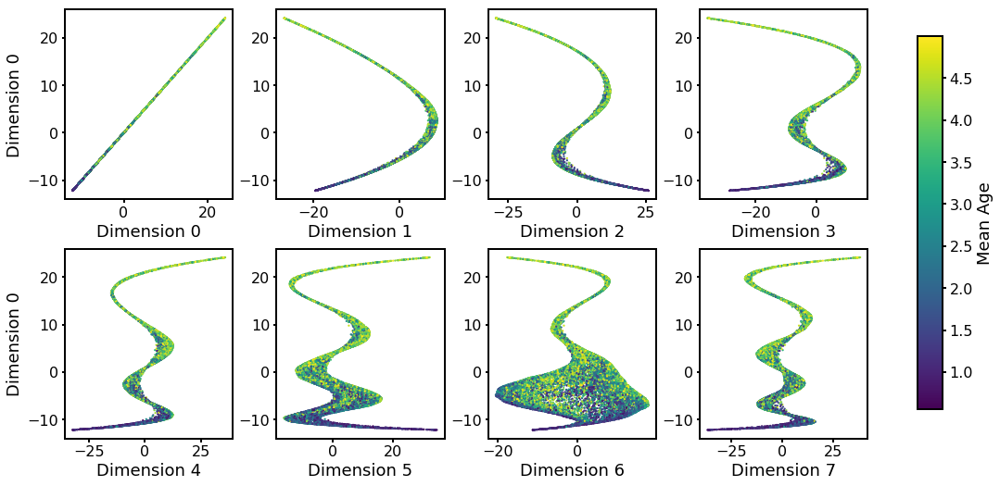

In [56]:
plot_vsdim_cc(ndim, use_embedyoung[:,0], mean_ages[mean_ages < 5.0][whyoung], ylabel='Dimension 0', cblabel='Mean Age', 
              use_embed=use_embedyoung)

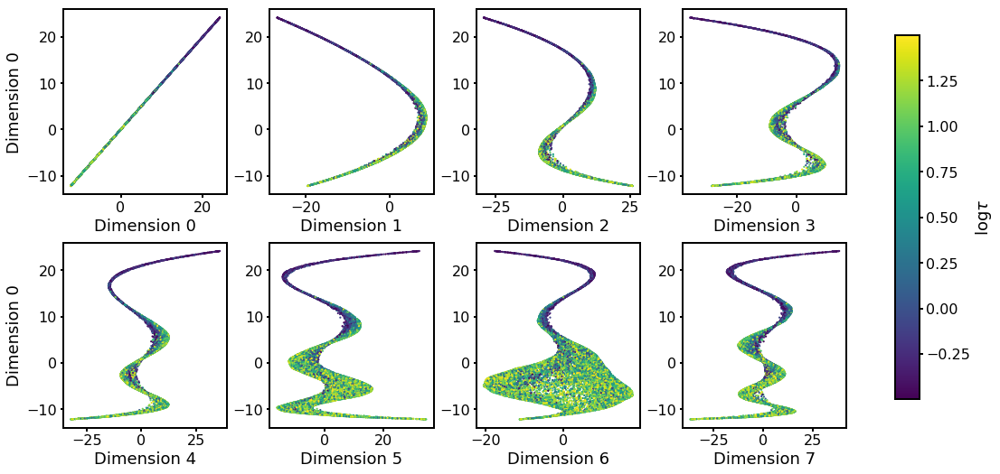

In [57]:
plot_vsdim_cc(ndim, use_embedyoung[:,0], np.log10(taus[mean_ages < 5.0][whyoung]), ylabel='Dimension 0',
              cblabel=r'$\log \tau$', use_embed=use_embedyoung)

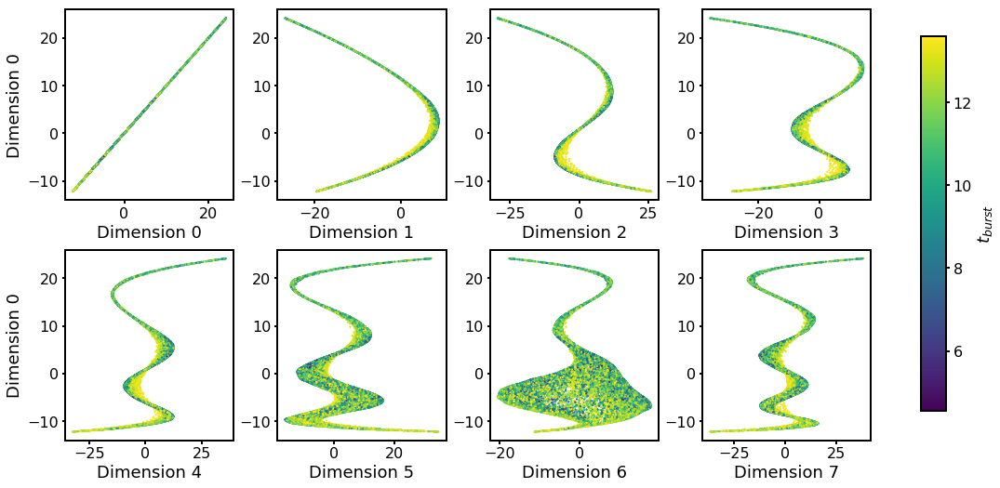

In [58]:
plot_vsdim_cc(ndim, use_embedyoung[:,0], tbursts[mean_ages < 5.0][whyoung], ylabel='Dimension 0',
              cblabel=r'$t_{burst}$', use_embed=use_embedyoung)

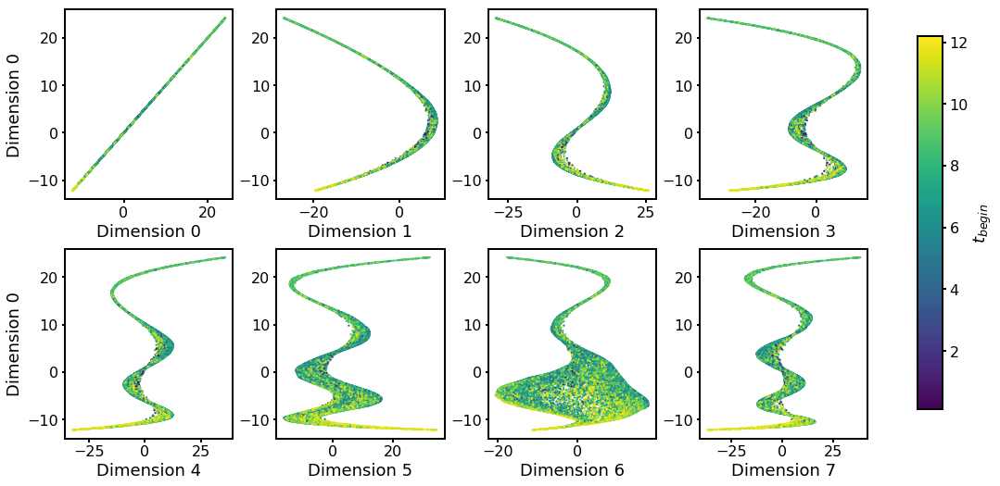

In [59]:
plot_vsdim_cc(ndim, use_embedyoung[:,0], sf_begins[mean_ages < 5.0][whyoung], ylabel='Dimension 0',
              cblabel=r'$t_{begin}$', use_embed=use_embedyoung)

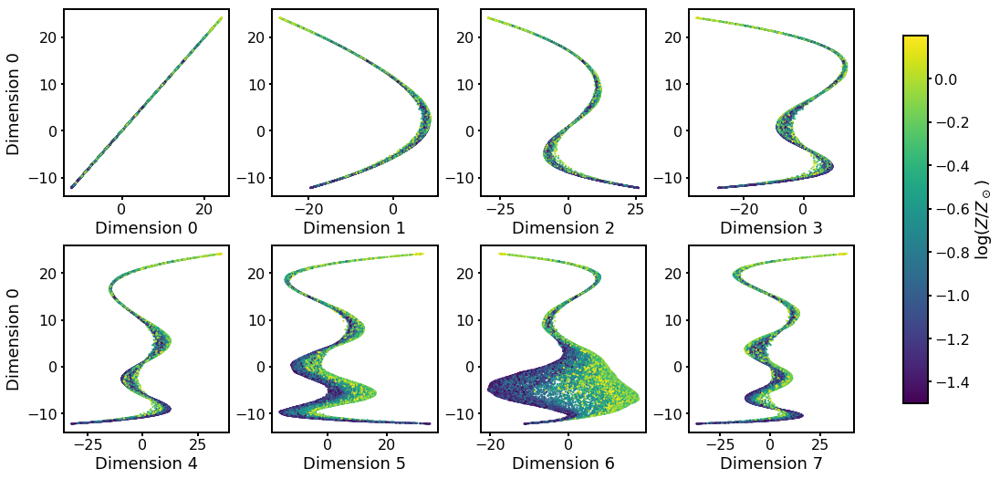

In [60]:
plot_vsdim_cc(ndim, use_embedyoung[:,0], zs[mean_ages < 5.0][whyoung], ylabel='Dimension 0',
              cblabel=r'$\log(Z/Z_\odot)$', use_embed=use_embedyoung)

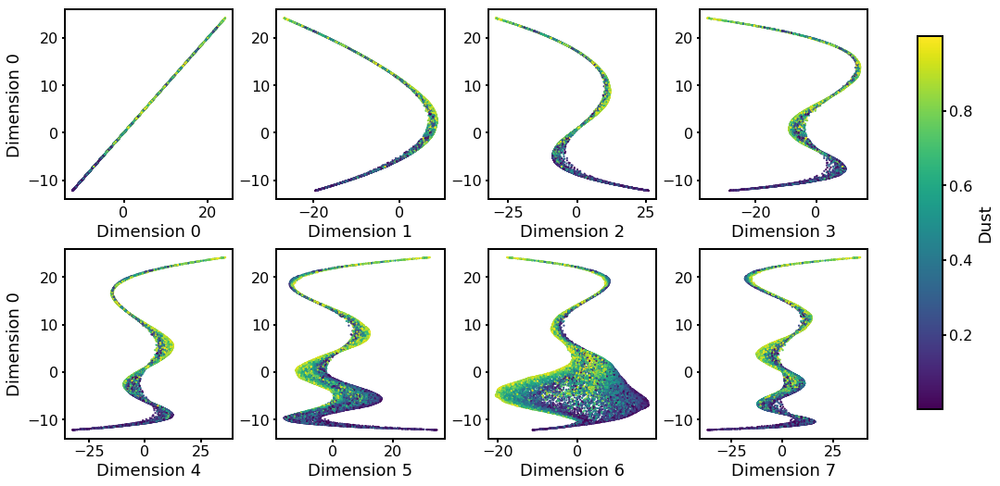

In [61]:
plot_vsdim_cc(ndim, use_embedyoung[:,0], dusts[mean_ages < 5.0][whyoung], ylabel='Dimension 0',
              cblabel='Dust', use_embed=use_embedyoung)